## Satellite Tracking
The recent privatization of space flight have led to the launch of thousands of artificial satellites. These satellites emit electromagnetic radiation across a wide variety of broad- and narrowband frequencies from both intentional and unintentional emissions ([Di Vruno et al. 2023](https://www.aanda.org/articles/aa/pdf/forth/aa46374-23.pdf)). These are begining to negatively impact all ground-based observing through tracks being left in optical images and false signals appearing in radio data.

In an attempt to keep track of satellite emissions, we are going to allocate 4 dishes at the Allen Telescope Array to collect emission data from the regions of the sky which are hte most affected. This will hopefully lead to an exhaustive list of frequencies and locations for all satellites in orbit.

The first step of this is to create a plot with the location of all active satellites in the sky above Hat Creek, the location of the Allen Telescope Array, throughout the course of one day. 

In [1]:
#Import everything you need
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from skyfield import almanac
from skyfield.api import load, wgs84
from skyfield.magnitudelib import planetary_magnitude
from skyfield.api import EarthSatellite
from astropy.coordinates import EarthLocation,SkyCoord
from astropy.time import Time
from astropy import units as u
from astropy.coordinates import AltAz
import matplotlib
%matplotlib notebook 
#Makes plots interactive
%autosave 30 
#Makes it to where it autosaves every minute instead of every 2 minutes, just for peace of mind

Autosaving every 30 seconds


In [2]:
#Use skyfield to import the TLE (two-line element) file [gives you all the information on a satellite's location at 
#the epoch, which can be used to find its location at any time] for all active satellites on Norad
active_url = 'https://celestrak.org/norad/elements/active.txt'
active = load.tle_file(active_url, reload = True)
print('Loaded', len(active), 'satellites')

[#################################] 100% active.txt


Loaded 8226 satellites


In [3]:
ts = load.timescale()
t = []
for i in range(24):
    for j in range(0, 60, 10):
            t.append(ts.utc(2023, 7, 13, i, j, 0))

In [4]:
observing_location= EarthLocation.of_site('ATA')#A different way to set our location
observing_time = []
for i in range(len(t)):
    observing_time.append(Time(t[i].utc_datetime()))
aa = AltAz(location=observing_location, obstime=observing_time)

In [5]:
ata = wgs84.latlon(+observing_location.lat.value, observing_location.lon.value)

In [6]:
names = []
for i in range(len(active)):
    names.append(active[i].name)

In [7]:
difference = []
for i in range(len(active)):
    difference.append(active[i] - ata)

In [8]:
topocentric = []
for i in range(len(difference)):
    for j in range(len(t)):
        topocentric.append(difference[i].at(t[j]))

In [9]:
%%time
#takes about 1 minute to run
alt = []
az = []
distance = []
for i in range(len(topocentric)):
    if np.isnan(topocentric[(i)].altaz()[0].degrees) == True:
        alt.append(0)
        az.append(0)
        distance.append(0)
    elif np.isnan(topocentric[(i)].altaz()[0].degrees) == False:
        alt.append(topocentric[i].altaz()[0].degrees)
        az.append(topocentric[i].altaz()[1].degrees)
        distance.append(topocentric[i].altaz()[2].au)

CPU times: user 1min 4s, sys: 1.14 s, total: 1min 5s
Wall time: 1min 6s


In [11]:
alt = np.reshape(alt, (len(active), len(t)))
az = np.reshape(az, (len(active), len(t)))
distance = np.reshape(distance, (len(active), len(t)))

To create the plots which show the areas where the most satellites are located, I used a heatmap.

Code for the heatmaps from [here](https://matplotlib.org/stable/gallery/images_contours_and_fields/image_annotated_heatmap.html)

In [12]:
def heatmap(data, row_labels, col_labels, ax=None,
            cbar_kw=None, cbarlabel="", **kwargs):
    """
    Create a heatmap from a numpy array and two lists of labels.

    Parameters
    ----------
    data
        A 2D numpy array of shape (M, N).
    row_labels
        A list or array of length M with the labels for the rows.
    col_labels
        A list or array of length N with the labels for the columns.
    ax
        A `matplotlib.axes.Axes` instance to which the heatmap is plotted.  If
        not provided, use current axes or create a new one.  Optional.
    cbar_kw
        A dictionary with arguments to `matplotlib.Figure.colorbar`.  Optional.
    cbarlabel
        The label for the colorbar.  Optional.
    **kwargs
        All other arguments are forwarded to `imshow`.
    """

    if ax is None:
        ax = plt.gca()

    if cbar_kw is None:
        cbar_kw = {}

    # Plot the heatmap
    im = ax.imshow(data, **kwargs)

    # Create colorbar
    cbar = ax.figure.colorbar(im, ax=ax, **cbar_kw, shrink = 0.5)
    cbar.ax.set_ylabel(cbarlabel, rotation=-90, va="bottom")

    # Show all ticks and label them with the respective list entries.
    ax.set_xticks(np.arange(data.shape[1]), labels=col_labels, fontsize = 9)
    ax.set_yticks(np.arange(data.shape[0]), labels=row_labels, fontsize = 9)

    # Let the horizontal axes labeling appear on top.
    ax.tick_params(top=False, bottom=True,
                   labeltop=False, labelbottom=True)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=80, ha="right",
             rotation_mode="anchor")

    # Turn spines off and create white grid.
    ax.spines[:].set_visible(False)

    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    #ax.grid(which="minor", color="w", linestyle='-', linewidth=3)
    ax.tick_params(which="minor", bottom=False, left=False)
    plt.gca().invert_yaxis()

    return im, cbar


def annotate_heatmap(im, data=None, valfmt="{x:.2f}",
                     textcolors=("black", "white"),
                     threshold=None, **textkw):
    """
    A function to annotate a heatmap.

    Parameters
    ----------
    im
        The AxesImage to be labeled.
    data
        Data used to annotate.  If None, the image's data is used.  Optional.
    valfmt
        The format of the annotations inside the heatmap.  This should either
        use the string format method, e.g. "$ {x:.2f}", or be a
        `matplotlib.ticker.Formatter`.  Optional.
    textcolors
        A pair of colors.  The first is used for values below a threshold,
        the second for those above.  Optional.
    threshold
        Value in data units according to which the colors from textcolors are
        applied.  If None (the default) uses the middle of the colormap as
        separation.  Optional.
    **kwargs
        All other arguments are forwarded to each call to `text` used to create
        the text labels.
    """

    if not isinstance(data, (list, np.ndarray)):
        data = im.get_array()

    # Normalize the threshold to the images color range.
    if threshold is not None:
        threshold = im.norm(threshold)
    else:
        threshold = im.norm(data.max())/2.

    # Set default alignment to center, but allow it to be
    # overwritten by textkw.
    kw = dict(horizontalalignment="center",
              verticalalignment="center")
    kw.update(textkw)

    # Get the formatter in case a string is supplied
    if isinstance(valfmt, str):
        valfmt = matplotlib.ticker.StrMethodFormatter(valfmt)

    # Loop over the data and create a `Text` for each "pixel".
    # Change the text's color depending on the data.
    texts = []
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            kw.update(color=textcolors[int(im.norm(data[i, j]) > threshold)], fontsize = 9)
            text = im.axes.text(j, i, valfmt(data[i, j], None), **kw)
            texts.append(text)

    return texts

For these plots, we are going to be looking at the sky above the ATA sectioned up 4 different ways -- 9$\times$36 (a 10 degree fov), 18${\times}$72 (a 5 degree fov), 30$\times$120 (a 3 degree fov), and 90$\times$360 (a 1 degree fov). 

First, the 9$\times$36

In [38]:
%%time
qt = []
at = []
for i in range(len(alt)):
    #print(i) #uncomment this if you want to see where it is in its running
    for j in range(len(t)):
        if alt[i][j] > 0:
            for h in range(0, 9):
                if (h*10) <= alt[i][j] < ((h+1)*10):
                    for k in range(0, 36):
                        if (k*10) <= az[i][j] < ((k+1)*10):
                            qt.append((h*36) + k + 1)
                            at.append((h*36) + k + 1)
        if alt[i][j] <= 0:
            qt.append(0)
            at.append(0)
        #if type(altaz_rebinned[i][j]) == int:
         #   qt.append(0)
          #  at.append(0)

CPU times: user 1.19 s, sys: 29.2 ms, total: 1.22 s
Wall time: 1.22 s


In [39]:
qt = np.reshape(qt, (len(active), len(t)))
at = np.reshape(at, (len(active), len(t)))

In [42]:
%%time
#I'm correcting for the geo satellites by setting 
for i in range(len(at)):
    for j in range(len(at[0])-1):
        if at[i][j] == at[i][j+1]:
            qt[i][j+1] = 0

CPU times: user 443 ms, sys: 12.1 ms, total: 455 ms
Wall time: 455 ms


In [67]:
qt = np.reshape(qt, (len(active) * len(t)))
at = np.reshape(at, (len(active) * len(t)))

In [68]:
%%time
s10fix = []
s10f2 = []
for i in range(len(qt)):
    s10fix.append(f's{qt[i]}')
for i in range(len(at)):
    s10f2.append(f's{at[i]}')


CPU times: user 474 ms, sys: 28.9 ms, total: 503 ms
Wall time: 502 ms


In [69]:
%%time
#which section the satellite is in
sections_10f = []
sections_10f2 = []
for i in range(1, 325):
    if s10fix.count(f's{i}') == 0:
        sections_10f.append(0)
        #print(i) #You can uncomment out the print function if you want to keep track of how it's running
    if s10fix.count(f's{i}') != 0:
        sections_10f.append(s10fix.count(f's{i}'))
        
for i in range(1, 325):
    if s10f2.count(f's{i}') == 0:
        sections_10f2.append(0)
        #print(i) #You can uncomment out the print function if you want to keep track of how it's running
    if s10f2.count(f's{i}') != 0:
        sections_10f2.append(s10f2.count(f's{i}'))

CPU times: user 15.2 s, sys: 337 ms, total: 15.5 s
Wall time: 15.6 s


In [70]:
%%time
alt_range10f = []
az_range10f = []

for i in range(0, 9):
    alt_range10f.append(f'{i*10} - {(i+1)*10}')
for i in range(0, 36):
    az_range10f.append(f'{i*10} - {(i + 1)*10}')

CPU times: user 14 µs, sys: 0 ns, total: 14 µs
Wall time: 15 µs


In [71]:
sections10f = np.reshape(sections_10f, (9, 36))
sections10f2 = np.reshape(sections_10f2, (9, 36))
#making it to where it's a 2d array to plot on the heatmap

<IPython.core.display.Javascript object>


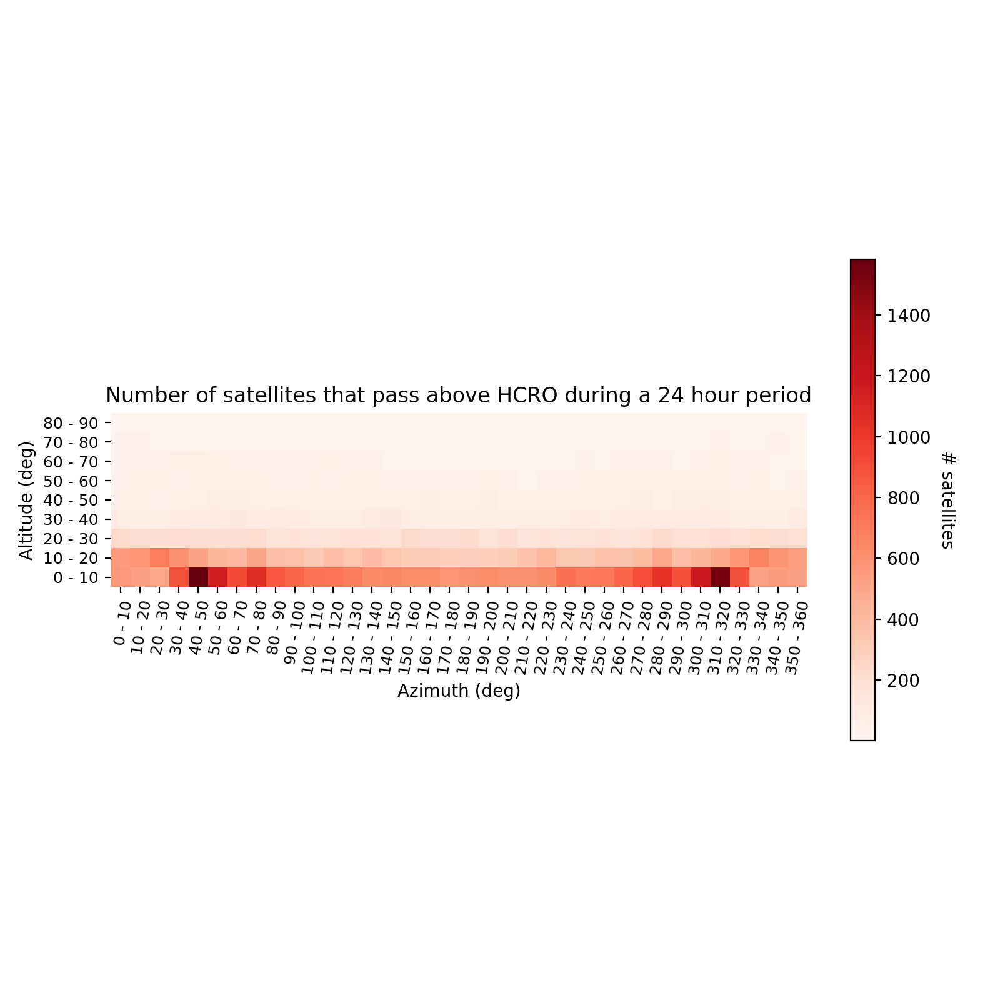

In [72]:
#With correcting for geo satellites
fig, ax = plt.subplots(figsize = (8, 8))

im, cbar = heatmap(np.array(sections10f), alt_range10f, az_range10f, ax=ax,
                   cmap="Reds", cbarlabel="# satellites")
#texts = annotate_heatmap(im, valfmt="{x:.0f}")
#uncomment out the line above if you want the text on the grids (sometimes hard to see)
plt.title('Number of satellites that pass above HCRO during a 24 hour period')
plt.xlabel('Azimuth (deg)')
plt.ylabel('Altitude (deg)')
fig.tight_layout()
plt.show()
#plt.savefig('10deg.jpeg')

<IPython.core.display.Javascript object>


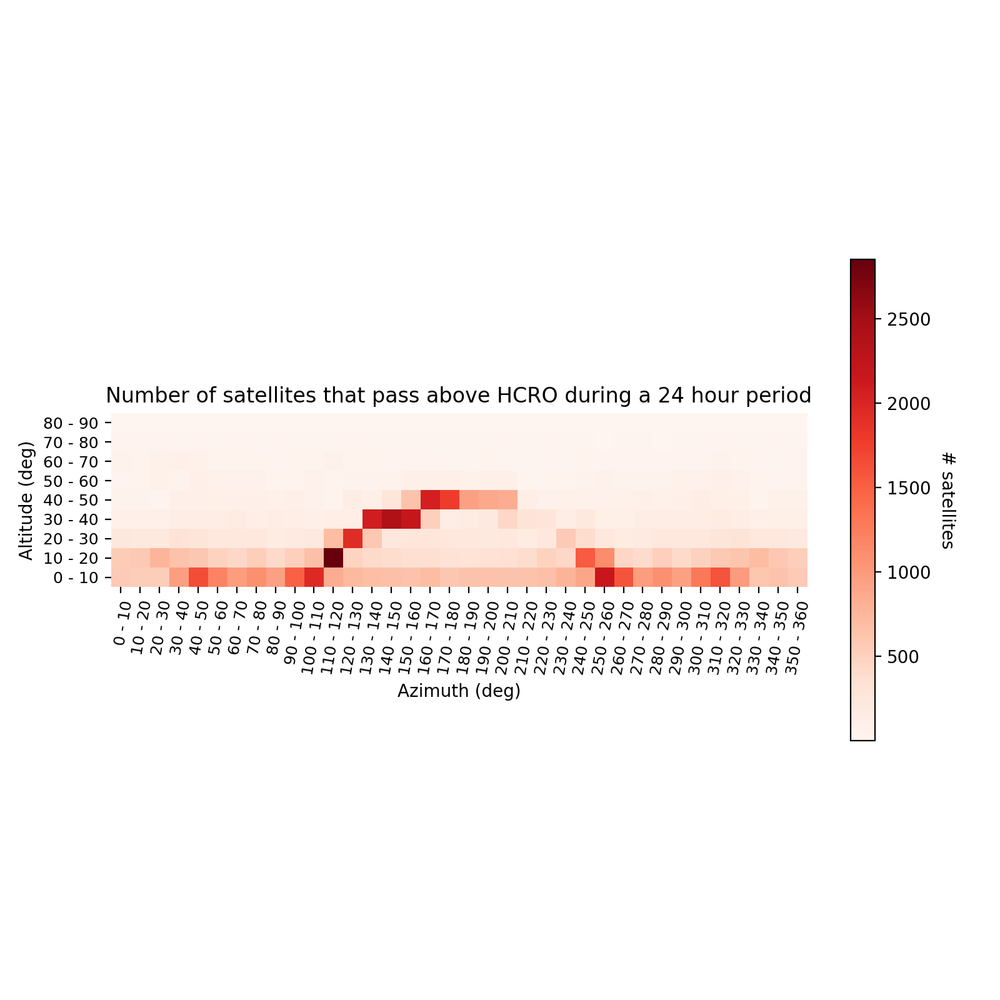

In [73]:
#Without correcting for geo satellites
fig, ax = plt.subplots(figsize = (8, 8))

im, cbar = heatmap(np.array(sections10f2), alt_range10f, az_range10f, ax=ax,
                   cmap="Reds", cbarlabel="# satellites")
#texts = annotate_heatmap(im, valfmt="{x:.0f}")
#uncomment out the line above if you want the text on the grids (sometimes hard to see)
plt.title('Number of satellites that pass above HCRO during a 24 hour period')
plt.xlabel('Azimuth (deg)')
plt.ylabel('Altitude (deg)')
fig.tight_layout()
plt.show()
#plt.savefig('10deg.jpeg')

And then for the $18 \times 72$ grid

In [74]:
%%time
qt5 = []
at5 = []
for i in range(len(alt)):
    #print(i)
    for j in range(len(t)):
        if alt[i][j] > 0:
            for h in range(0, 18):
                if (h*5) <= alt[i][j] < ((h+1)*5):
                    for k in range(0, 72):
                        if (k*5) <= az[i][j] < ((k+1)*5):
                            qt5.append((h*72) + k + 1)
                            at5.append((h*72) + k + 1)
        if alt[i][j] <= 0:
            qt5.append(0)
            at5.append(0)
        #if type(altaz_rebinned[i][j]) == int:
         #   qt.append(0)
          #  at.append(0)

CPU times: user 1.88 s, sys: 39.6 ms, total: 1.92 s
Wall time: 1.92 s


In [75]:
qt5 = np.reshape(qt5, (len(active), len(t)))
at5 = np.reshape(at5, (len(active), len(t)))

In [77]:
for i in range(len(at5)):
    for j in range(len(at5[0])-1):
        if at5[i][j] == at5[i][j+1]:
            qt5[i][j+1] = 0

In [78]:
qt5 = np.reshape(qt5, (len(active) * len(t)))
at5 = np.reshape(at5, (len(active) * len(t)))

In [79]:
%%time
s5q = []
s5a = []
for i in range(len(qt5)):
    s5q.append(f's{qt5[i]}')
for i in range(len(at5)):
    s5a.append(f's{at5[i]}')


CPU times: user 466 ms, sys: 26.7 ms, total: 493 ms
Wall time: 492 ms


In [80]:
%%time
#takes about 1 minute
#which section the satellite is in
sections_5q = []
sections_5a = []
for i in range(1, 1297):
    if s5q.count(f's{i}') == 0:
        sections_5q.append(0)
        #print(i) #You can uncomment out the print function if you want to keep track of how it's running
    if s5q.count(f's{i}') != 0:
        sections_5q.append(s5q.count(f's{i}'))
        
for i in range(1, 1297):
    if s5a.count(f's{i}') == 0:
        sections_5a.append(0)
        #print(i) #You can uncomment out the print function if you want to keep track of how it's running
    if s5a.count(f's{i}') != 0:
        sections_5a.append(s5a.count(f's{i}'))

CPU times: user 1min, sys: 1.31 s, total: 1min 1s
Wall time: 1min 2s


In [81]:
%%time
alt_range5f = []
az_range5f = []

for i in range(0,18):
    alt_range5f.append(f'{i*5} - {(i+1)*5}')
for i in range(0, 72):
    az_range5f.append(f'{i*5} - {(i + 1)*5}')

CPU times: user 54 µs, sys: 1e+03 ns, total: 55 µs
Wall time: 60.1 µs


In [82]:
az_range5f_label = []
alt_range5f_label = []
azs5 = []
alts5 = []
for i in range(int(len(az_range5f)/2)):
    azs5.append((i*2)+1)
    az_range5f_label.append(az_range5f[azs5[-1]])
    
for i in range(int(len(alt_range5f)/2)):
    alts5.append((i*2)+1)
    alt_range5f_label.append(alt_range5f[alts5[-1]])

In [83]:
sections5a = np.reshape(sections_5a, (18, 72))
sections5q = np.reshape(sections_5q, (18, 72))
#making it to where it's a 2d array to plot on the heatmap

<IPython.core.display.Javascript object>


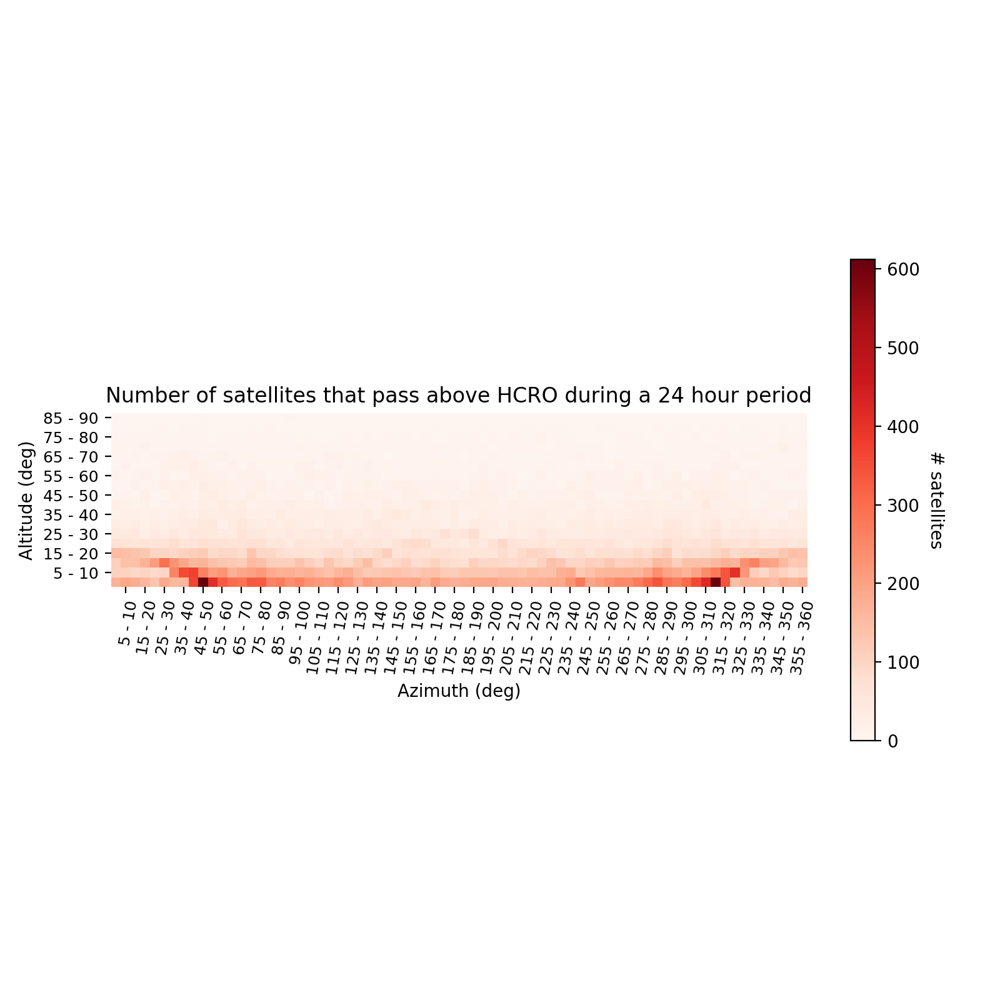

In [84]:
#with correcting for geo
fig, ax = plt.subplots(figsize = (8, 8))

im, cbar = heatmap(np.array(sections5q), alt_range5f, az_range5f, ax=ax,
                   cmap="Reds", cbarlabel="# satellites")
#texts = annotate_heatmap(im, valfmt="{x:.0f}")
#uncomment out the line above if you want the text on the grids (sometimes hard to see)
plt.title('Number of satellites that pass above HCRO during a 24 hour period')
plt.xticks(ticks = azs5, labels=az_range5f_label)
plt.yticks(ticks = alts5, labels = alt_range5f_label)
plt.xlabel('Azimuth (deg)')
plt.ylabel('Altitude (deg)')
fig.tight_layout()
plt.show()
plt.savefig('5deg.jpeg')

<IPython.core.display.Javascript object>


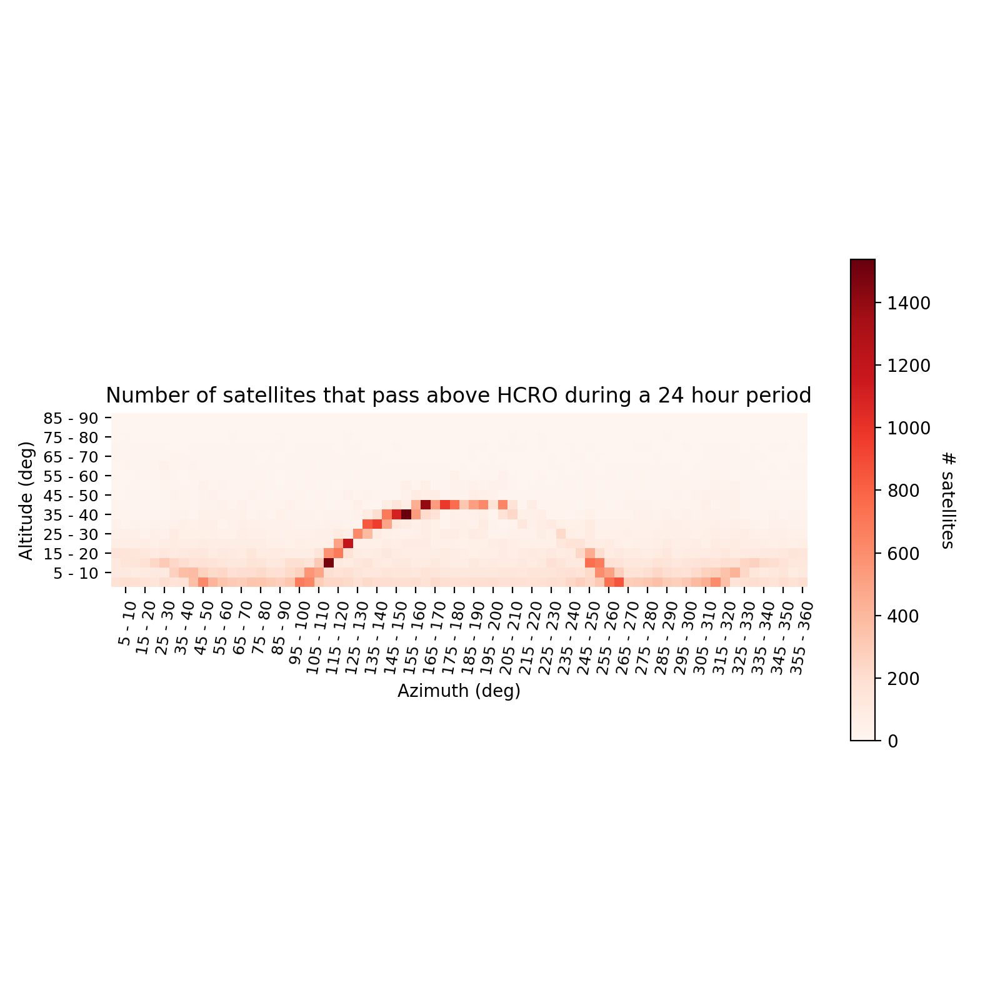

In [85]:
#Without correcting for geo
fig, ax = plt.subplots(figsize = (8, 8))

im, cbar = heatmap(np.array(sections5a), alt_range5f, az_range5f, ax=ax,
                   cmap="Reds", cbarlabel="# satellites")
#texts = annotate_heatmap(im, valfmt="{x:.0f}")
#uncomment out the line above if you want the text on the grids (sometimes hard to see)
plt.title('Number of satellites that pass above HCRO during a 24 hour period')
plt.xticks(ticks = azs5, labels=az_range5f_label)
plt.yticks(ticks = alts5, labels = alt_range5f_label)
plt.xlabel('Azimuth (deg)')
plt.ylabel('Altitude (deg)')
fig.tight_layout()
plt.show()
plt.savefig('5deg.jpeg')

And then for the $30 \times 120$ grid

In [86]:
%%time
qt3 = []
at3 = []
for i in range(len(alt)):
    #print(i)
    for j in range(len(t)):
        if alt[i][j] > 0:
            for h in range(0, 30):
                if (h*3) <= alt[i][j] < ((h+1)*3):
                    for k in range(0, 120):
                        if (k*3) <= az[i][j] < ((k+1)*3):
                            qt3.append((h*120) + k + 1)
                            at3.append((h*120) + k + 1)
        if alt[i][j] <= 0:
            qt3.append(0)
            at3.append(0)
        #if type(altaz_rebinned[i][j]) == int:
         #   qt.append(0)
          #  at.append(0)

CPU times: user 2.88 s, sys: 63.9 ms, total: 2.95 s
Wall time: 2.97 s


In [87]:
qt3 = np.reshape(qt3, (len(active), len(t)))
at3 = np.reshape(at3, (len(active), len(t)))

In [88]:
for i in range(len(at3)):
    for j in range(len(at3[0])-1):
        if at3[i][j] == at3[i][j+1]:
            qt3[i][j+1] = 0

In [89]:
qt3 = np.reshape(qt3, (len(active) * len(t)))
at3 = np.reshape(at3, (len(active) * len(t)))

In [90]:
%%time
s3q = []
s3a = []
for i in range(len(qt3)):
    s3q.append(f's{qt3[i]}')
    
for i in range(len(at3)):
    s3a.append(f's{at3[i]}')


CPU times: user 498 ms, sys: 28.9 ms, total: 527 ms
Wall time: 526 ms


In [91]:
%%time
#About 3 minutes
#which section the satellite is in
sections_3a = []
sections_3q = []
for i in range(1, 3601):
    if s3a.count(f's{i}') == 0:
        sections_3a.append(0)
        #print(i) #You can uncomment out the print function if you want to keep track of how it's running
    if s3a.count(f's{i}') != 0:
        sections_3a.append(s3a.count(f's{i}'))
        
for i in range(1, 3601):
    if s3q.count(f's{i}') == 0:
        sections_3q.append(0)
        #print(i) #You can uncomment out the print function if you want to keep track of how it's running
    if s3q.count(f's{i}') != 0:
        sections_3q.append(s3q.count(f's{i}'))

CPU times: user 2min 44s, sys: 3.6 s, total: 2min 47s
Wall time: 2min 48s


In [92]:
%%time
alt_range3f = []
az_range3f = []

for i in range(0,30):
    alt_range3f.append(f'{i*3} - {(i+1)*3}')
for i in range(0, 120):
    az_range3f.append(f'{i*3} - {(i + 1)*3}')

CPU times: user 196 µs, sys: 69 µs, total: 265 µs
Wall time: 274 µs


In [93]:
#Creating the x- and y-axis tick labels for the heatmap
az_range3f_label = []
alt_range3f_label = []
azs3 = []
alts3 = []
for i in range(1, int(len(az_range3f)/5)):
    azs3.append((i*5)-1)
    az_range3f_label.append(az_range3f[azs3[-1]])
    
for i in range(1, int(len(alt_range3f)/5)):
    alts3.append((i*5)-1)
    alt_range3f_label.append(alt_range3f[alts3[-1]])

In [94]:
sections3a = np.reshape(sections_3a, (30, 120))
sections3q = np.reshape(sections_3q, (30, 120))
#making it to where it's a 2d array to plot on the heatmap

<IPython.core.display.Javascript object>


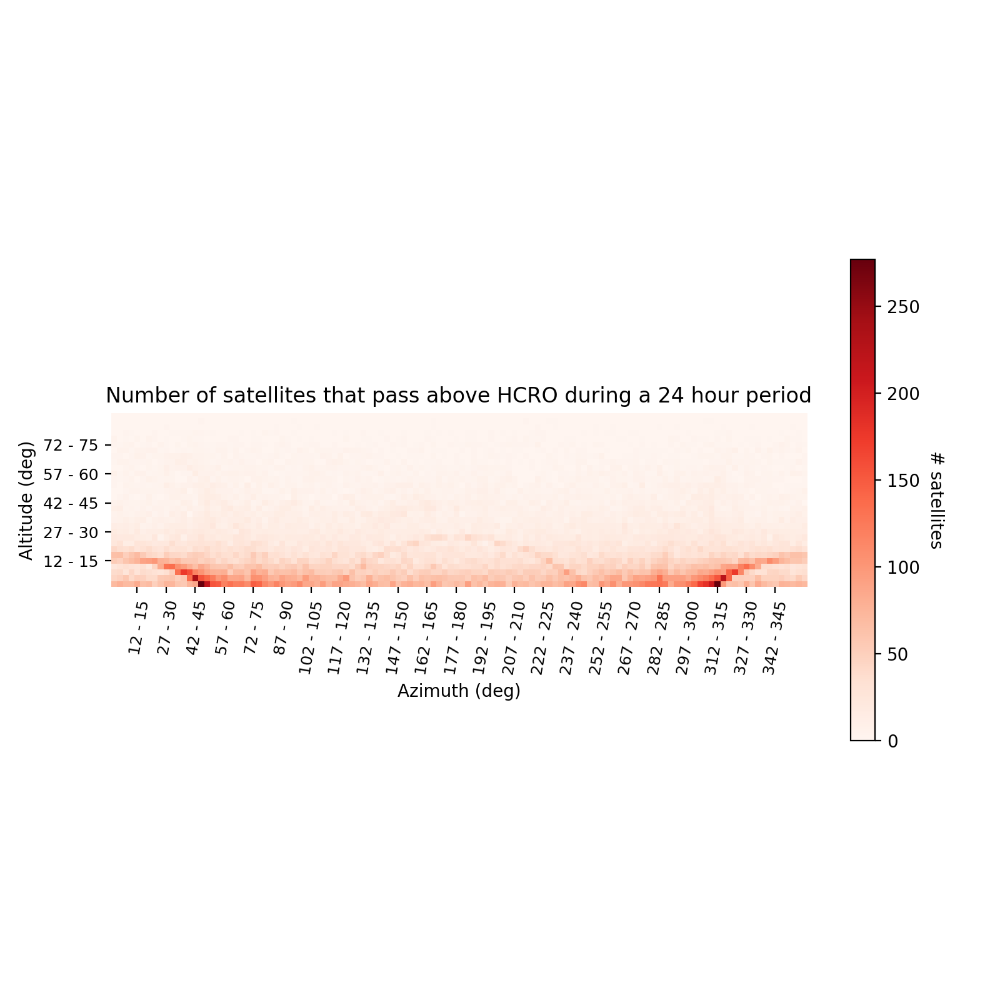

In [96]:
#with correcting for geo
fig, ax = plt.subplots(figsize = (8, 8))

im, cbar = heatmap(np.array(sections3q), alt_range3f, az_range3f, ax=ax,
                   cmap="Reds", cbarlabel="# satellites")
#texts = annotate_heatmap(im, valfmt="{x:.0f}")
#uncomment out the line above if you want the text on the grids (sometimes hard to see)
plt.title('Number of satellites that pass above HCRO during a 24 hour period')
plt.xticks(ticks = azs3, labels=az_range3f_label)
plt.yticks(ticks = alts3, labels = alt_range3f_label)
plt.xlabel('Azimuth (deg)')
plt.ylabel('Altitude (deg)')
fig.tight_layout()
plt.show()
plt.savefig('5deg.jpeg')

<IPython.core.display.Javascript object>


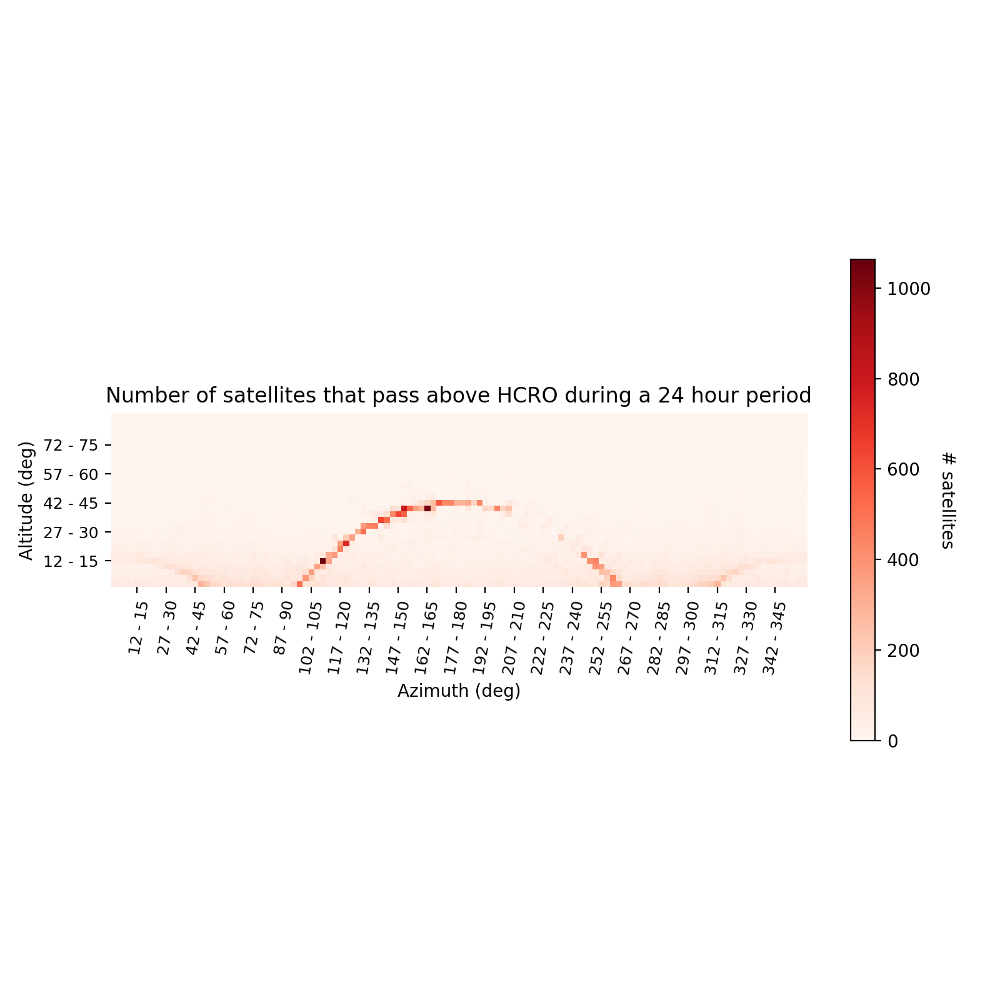

In [98]:
#without correcting for geo
fig, ax = plt.subplots(figsize = (8, 8))

im, cbar = heatmap(np.array(sections3a), alt_range3f, az_range3f, ax=ax,
                   cmap="Reds", cbarlabel="# satellites")
#texts = annotate_heatmap(im, valfmt="{x:.0f}")
#uncomment out the line above if you want the text on the grids (sometimes hard to see)
plt.title('Number of satellites that pass above HCRO during a 24 hour period')
plt.xticks(ticks = azs3, labels=az_range3f_label)
plt.yticks(ticks = alts3, labels = alt_range3f_label)
plt.xlabel('Azimuth (deg)')
plt.ylabel('Altitude (deg)')
fig.tight_layout()
plt.show()
plt.savefig('5deg.jpeg')

And then for the $90 \times 360$ grid

In [103]:
%%time
qt1 = []
at1 = []
for i in range(len(alt)):
    #print(i)
    for j in range(len(t)):
        if alt[i][j] > 0:
            for h in range(0, 90):
                if (h*1) <= alt[i][j] < ((h+1)*1):
                    for k in range(0, 360):
                        if (k*1) <= az[i][j] < ((k+1)*1):
                            qt1.append((h*360) + k + 1)
                            at1.append((h*360) + k + 1)
        if alt[i][j] <= 0:
            qt1.append(0)
            at1.append(0)
        #if type(altaz_rebinned[i][j]) == int:
         #   qt.append(0)
          #  at.append(0)

CPU times: user 7.82 s, sys: 115 ms, total: 7.94 s
Wall time: 7.95 s


In [104]:
qt1 = np.reshape(qt1, (len(active), len(t)))
at1 = np.reshape(at1, (len(active), len(t)))

In [106]:
for i in range(len(at1)):
    for j in range(len(at1[0])-1):
        if at1[i][j] == at1[i][j+1]:
            qt1[i][j+1] = 0

In [107]:
qt1 = np.reshape(qt1, (len(active) * len(t)))
at1 = np.reshape(at1, len(active) * len(t))

In [108]:
%%time
s1a = []
s1q = []
for i in range(len(at1)):
    s1a.append(f's{at1[i]}')
for i in range(len(qt1)):
    s1q.append(f's{qt1[i]}')


CPU times: user 501 ms, sys: 27.4 ms, total: 528 ms
Wall time: 527 ms


In [109]:
%%time
#About 21 minutes to run
#which section the satellite is in
sections_1a = []
sections_1q = []
for i in range(1, 32401):
    #print(i) #Uncomment this if you want to see how much it's run
    if s1a.count(f's{i}') == 0:
        sections_1a.append(0)
        #print(i) #You can uncomment out the print function if you want to keep track of how it's running
    if s1a.count(f's{i}') != 0:
        sections_1a.append(s1a.count(f's{i}'))
    if s1q.count(f's{i}') == 0:
        sections_1q.append(0)
    if s1q.count(f's{i}') != 0:
        sections_1q.append(s1q.count(f's{i}'))

CPU times: user 21min 45s, sys: 27.3 s, total: 22min 12s
Wall time: 22min 21s


In [110]:
%%time
alt_range1f = []
az_range1f = []

for i in range(0,90):
    alt_range1f.append(f'{i*1} - {(i+1)*1}')
for i in range(0, 360):
    az_range1f.append(f'{i*1} - {(i + 1)*1}')

CPU times: user 296 µs, sys: 49 µs, total: 345 µs
Wall time: 353 µs


In [111]:
az_range1f_label = []
alt_range1f_label = []
azs1 = []
alts1 = []
for i in range(1, int(len(az_range1f)/10)):
    azs1.append((i*10)-1)
    az_range1f_label.append(az_range1f[azs1[-1]])
    
for i in range(1, int(len(alt_range1f)/10)):
    alts1.append((i*10)-1)
    alt_range1f_label.append(alt_range1f[alts1[-1]])

In [112]:
sections1a = np.reshape(sections_1a, (90, 360))
sections1q = np.reshape(sections_1q, (90, 360))
#making it to where it's a 2d array to plot on the heatmap

<IPython.core.display.Javascript object>


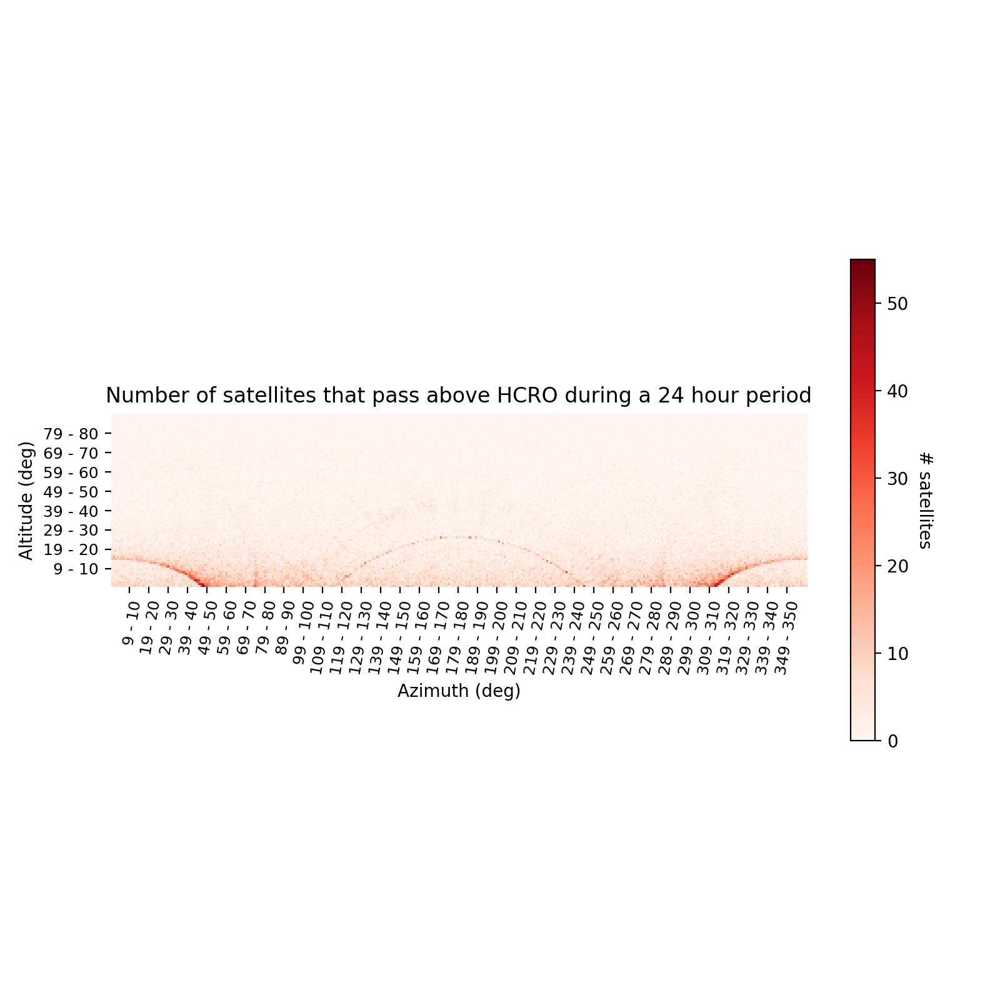

In [113]:
#with correcting for geo
fig, ax = plt.subplots(figsize = (8, 8))

im, cbar = heatmap(np.array(sections1q), alt_range1f, az_range1f, ax=ax,
                   cmap="Reds", cbarlabel="# satellites")
#texts = annotate_heatmap(im, valfmt="{x:.0f}")
#uncomment out the line above if you want the text on the grids (sometimes hard to see)
plt.title('Number of satellites that pass above HCRO during a 24 hour period')
plt.xticks(ticks = azs1, labels=az_range1f_label)
plt.yticks(ticks = alts1, labels = alt_range1f_label)
plt.xlabel('Azimuth (deg)')
plt.ylabel('Altitude (deg)')
fig.tight_layout()
plt.show()
#plt.savefig('5deg.jpeg')

<IPython.core.display.Javascript object>


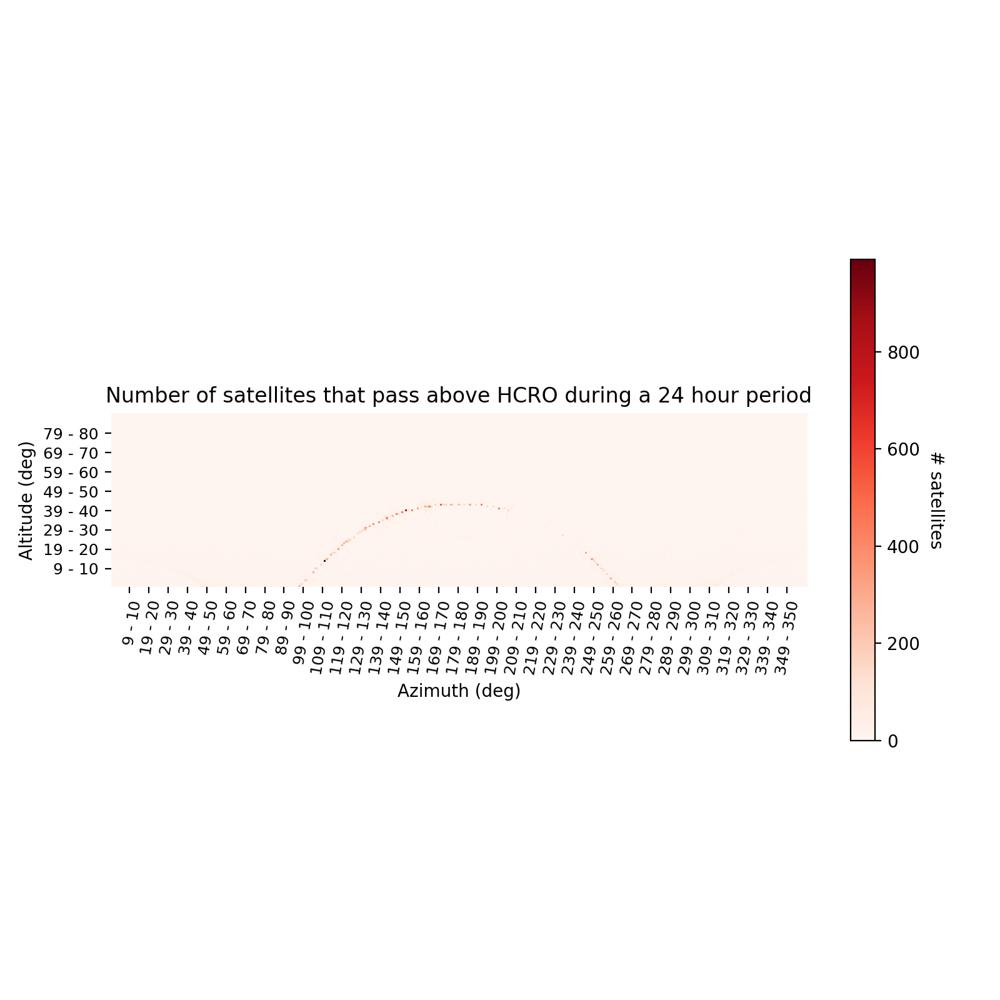

In [114]:
#without correcting for geo
fig, ax = plt.subplots(figsize = (8, 8))

im, cbar = heatmap(np.array(sections1a), alt_range1f, az_range1f, ax=ax,
                   cmap="Reds", cbarlabel="# satellites")
#texts = annotate_heatmap(im, valfmt="{x:.0f}")
#uncomment out the line above if you want the text on the grids (sometimes hard to see)
plt.title('Number of satellites that pass above HCRO during a 24 hour period')
plt.xticks(ticks = azs1, labels=az_range1f_label)
plt.yticks(ticks = alts1, labels = alt_range1f_label)
plt.xlabel('Azimuth (deg)')
plt.ylabel('Altitude (deg)')
fig.tight_layout()
plt.show()
#plt.savefig('5deg.jpeg')

Trying to separate out the satellite types

In [115]:
import urllib

In [116]:
data = urllib.request.urlopen('https://celestrak.org/norad/elements/active.txt').read()

In [118]:
%%time
#About 3 minutes to run
namess = []
for i in range(int(len(data.splitlines())/3)):
    #print(i) #Uncomment this out if you want to see how much it's run
    n = []
    for j in range(len(data.splitlines()[i*3])):
        n.append(data.splitlines()[i*3].decode()[-(j+1)])
    for j in range(len(n)):
        if n[j] != ' ':
            namess.append(data.splitlines()[i*3].decode()[:(len(n) - j)])
            break

CPU times: user 3min 15s, sys: 9.51 s, total: 3min 24s
Wall time: 3min 25s


In [119]:
%%time
from skyfield.api import EarthSatellite

ts = load.timescale()
satellites = []
line1 = []
line2 = []
for i in range(len(namess)):
    named = namess[i]
    line1.append(data.splitlines()[(i*3)+1].decode())
    line2.append(data.splitlines()[(i*3)+2].decode())
    satellites.append(EarthSatellite(line1[i], line2[i], named, ts))
#print(satellite

CPU times: user 15.3 s, sys: 1.76 s, total: 17.1 s
Wall time: 17.1 s


In [120]:
%%time
alt = np.reshape(alt, (len(active) * len(t)))
az = np.reshape(az, (len(active) * len(t)))
distance = np.reshape(distance, (len(active) * len(t)))


CPU times: user 11 µs, sys: 0 ns, total: 11 µs
Wall time: 12.9 µs


In [121]:
altaz = []
for i in range(len(alt)):
    altaz.append([alt[i], az[i]])

In [66]:
a = []
for i in range(len(line2)):
    a.append(float(line2[i][52:63]))

In [122]:
MEO = []
LEO = []
GEO = []
HEO = []
for i in range(len(line2)):
    if 1.0 < float(line2[i][52:63]) < 1.00275:
        GEO.append(i)
    if float(line2[i][52:63]) <= 1.0:
        HEO.append(i)
    if 1.00275 < float(line2[i][52:63]) <= 12:
        MEO.append(i)
    if 12 < float(line2[i][52:63]):
        LEO.append(i)

<IPython.core.display.Javascript object>


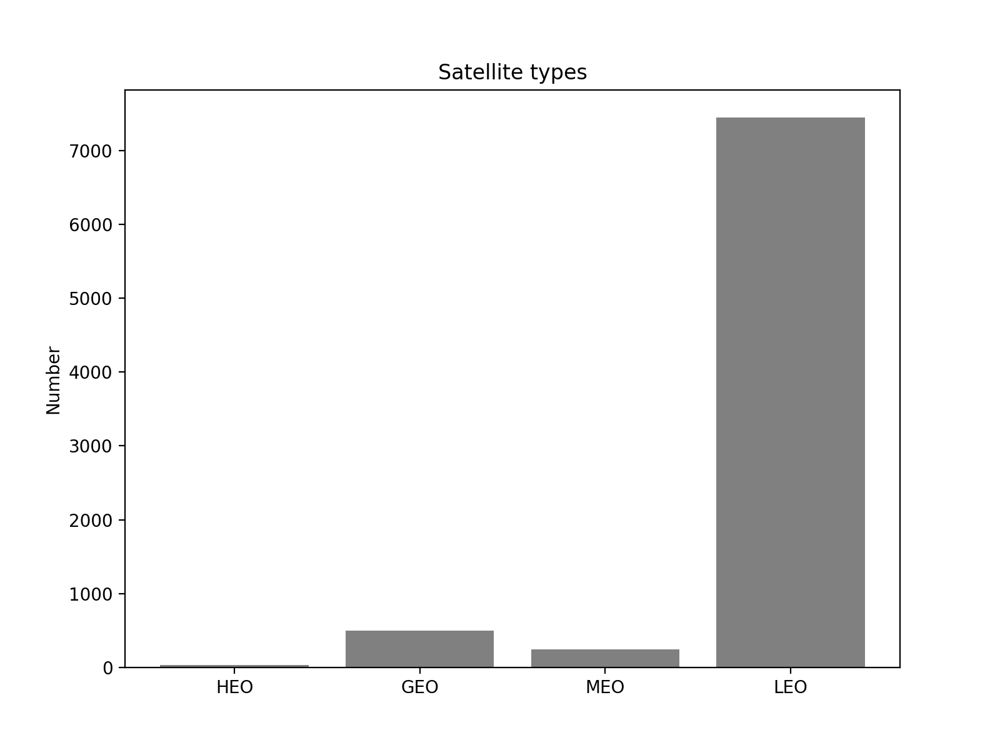

In [123]:
sy = [len(HEO), len(GEO), len(MEO), len(LEO)]
sx = ['HEO', 'GEO', 'MEO', 'LEO']
plt.figure(figsize = (8, 6))
plt.title('Satellite types')
plt.ylabel('Number')
plt.autumn()
plt.bar(sx, sy, color = 'grey')
plt.show()

In [124]:
sx = []
sy = []
for i in range(17):
    a = 0
    for j in range(len(line2)):
        if (i) < float(line2[j][52:63]) < ((i + 1)):
            a += 1
    sy.append(i)
    sx.append(a)

In [125]:
sx101 = []
sy101 = []
for i in range(len(line2)):
    if 100275 < float(line2[j][52:63]) <= 2:
        a += 1
sx101.append(a)

<IPython.core.display.Javascript object>


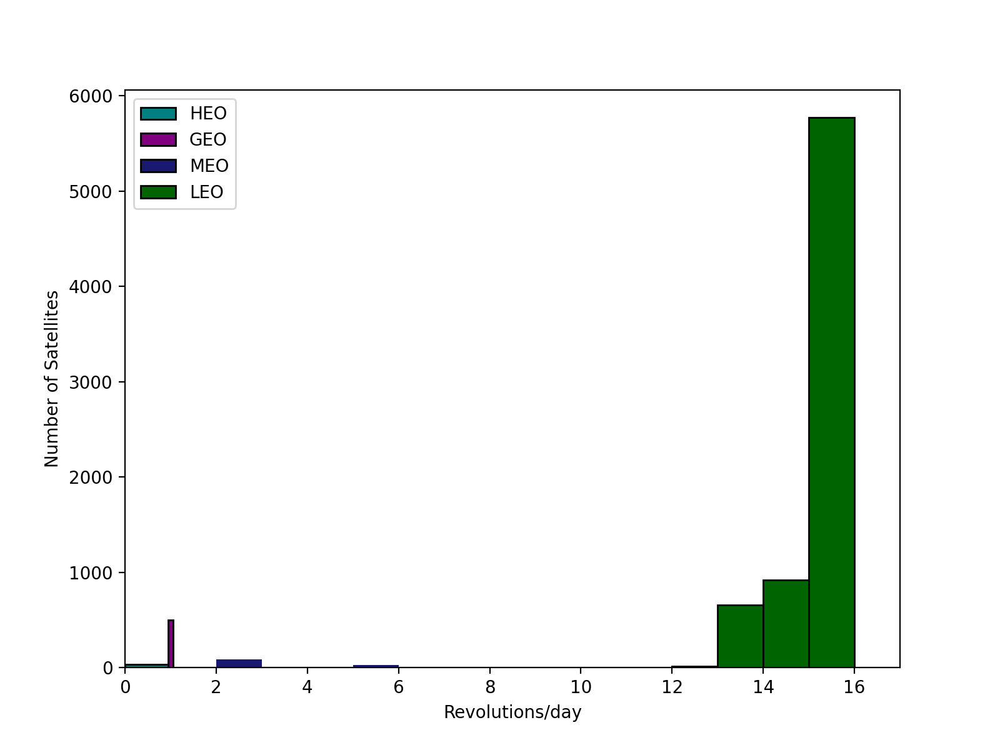

In [126]:
plt.figure(figsize = (8, 6))
plt.bar(0.5, sx[0], width = 1, label = 'HEO', color = 'teal', edgecolor = 'k')
plt.bar(1, len(GEO), width = 0.1, label = 'GEO', color = 'purple', edgecolor = 'k')
plt.bar(1.505, sx101, width = 0.99, label = 'MEO', color = 'midnightblue', edgecolor = 'k')
for i in range(2, 12):
    plt.bar((i+0.5), sx[i], width = 1, color = 'midnightblue')
plt.bar(12.5, sy[12], width = 1, label = 'LEO', color = 'darkgreen', edgecolor = 'k')
for i in range(13, 17):
    plt.bar((i+0.5), sx[i], width = 1, color = 'darkgreen', edgecolor = 'k')
plt.xlim(0, 17)
plt.legend()
plt.xlabel('Revolutions/day')
plt.ylabel('Number of Satellites')
plt.show()

In [143]:
alt = np.reshape(alt, (len(active), len(t)))
az = np.reshape(az, (len(active), len(t)))
distance = np.reshape(distance, (len(active), len(t)))

In [144]:
%%time
alt_GEO = []
az_GEO = []
distance_GEO = []
alt_MEO = []
az_MEO = []
distance_MEO = []
alt_HEO = []
az_HEO = []
distance_HEO = []
alt_LEO = []
az_LEO = []
distance_LEO = []
for i in range(len(alt)):
    #print(i)
    for j in range(len(GEO)):
        if i == GEO[j]:
            for k in range(len(t)):
                alt_GEO.append(alt[i][k])
                az_GEO.append(az[i][k])
                distance_GEO.append(distance[i][k])
    for j in range(len(MEO)):
        if i == MEO[j]:
            for k in range(len(t)):
                alt_MEO.append(alt[i][k])
                az_MEO.append(az[i][k])
                distance_MEO.append(distance[i][k])
    for j in range(len(HEO)):
        if i == HEO[j]:
            for k in range(len(t)):
                alt_HEO.append(alt[i][k])
                az_HEO.append(az[i][k])
                distance_HEO.append(distance[i][k])
    for j in range(len(LEO)):
        if i == LEO[j]:
            for k in range(len(t)):
                alt_LEO.append(alt[i][k])
                az_LEO.append(az[i][k])
                distance_LEO.append(distance[i][k])


CPU times: user 3.66 s, sys: 96.1 ms, total: 3.75 s
Wall time: 3.77 s


Making 2D rectangular plots to get a feel for what the Mollweide plots should look like

In [145]:
%%time
qgeo5 = []
ageo5 = []
for i in range(len(alt_GEO)):
    #print(i)
    #for j in range(len(t)):
    if alt_GEO[i] > 0: #alt
        for h in range(0, 18):
            if (h*5) <= alt_GEO[i] < ((h+1)*5): #alt
                for k in range(0, 72):
                    if (k*5) <= az_GEO[i] < ((k+1)*5): #az
                        qgeo5.append((h*72) + k + 1)
                        ageo5.append((h*72) + k + 1)
    if alt_GEO[i] <= 0: #alt
        qgeo5.append(0)
        ageo5.append(0)

qheo5 = []
aheo5 = []
for i in range(len(alt_HEO)):
    #print(i)
    #for j in range(len(t)):
    if alt_HEO[i] > 0: #alt
        for h in range(0, 18):
            if (h*5) <= alt_HEO[i] < ((h+1)*5): #alt
                for k in range(0, 72):
                    if (k*5) <= az_HEO[i] < ((k+1)*5): #az
                        qheo5.append((h*72) + k + 1)
                        aheo5.append((h*72) + k + 1)
    if alt_HEO[i] <= 0: #alt
        qheo5.append(0)
        aheo5.append(0)
        
qmeo5 = []
ameo5 = []
for i in range(len(alt_MEO)):
    #print(i)
    #for j in range(len(t)):
    if alt_MEO[i] > 0: #alt
        for h in range(0, 18):
            if (h*5) <= alt_MEO[i] < ((h+1)*5): #alt
                for k in range(0, 72):
                    if (k*5) <= az_MEO[i] < ((k+1)*5): #az
                        qmeo5.append((h*72) + k + 1)
                        ameo5.append((h*72) + k + 1)
    if alt_MEO[i] <= 0: #alt
        qmeo5.append(0)
        ameo5.append(0)
        
qleo5 = []
aleo5 = []
for i in range(len(alt_LEO)):
    #print(i)
    #for j in range(len(t)):
    if alt_LEO[i] > 0: #alt
        for h in range(0, 18):
            if (h*5) <= alt_LEO[i] < ((h+1)*5): #alt
                for k in range(0, 72):
                    if (k*5) <= az_LEO[i] < ((k+1)*5): #az
                        qleo5.append((h*72) + k + 1)
                        aleo5.append((h*72) + k + 1)
    if alt_LEO[i] <= 0: #alt
        qleo5.append(0)
        aleo5.append(0)

CPU times: user 964 ms, sys: 22.3 ms, total: 987 ms
Wall time: 987 ms


In [146]:
qgeo5r = np.reshape(qgeo5, (len(GEO), len(t)))
ageo5r = np.reshape(ageo5, (len(GEO), len(t)))

qmeo5r = np.reshape(qmeo5, (len(MEO), len(t)))
ameo5r = np.reshape(ameo5, (len(MEO), len(t)))

qheo5r = np.reshape(qheo5, (len(HEO), len(t)))
aheo5r = np.reshape(aheo5, (len(HEO), len(t)))

qleo5r = np.reshape(qleo5, (len(LEO), len(t)))
aleo5r = np.reshape(aleo5, (len(LEO), len(t)))

In [147]:
%%time
for j in range(len(qgeo5r)):
    for i in range(len(qgeo5r[0])-1):
        if ageo5r[j][i] == ageo5r[j][i+1]:
            qgeo5r[j][i+1] = 0
            
for j in range(len(qmeo5r)):
    for i in range(len(qmeo5r[0])-1):
        if ameo5r[j][i] == ameo5r[j][i+1]:
            qmeo5r[j][i+1] = 0
            
for j in range(len(qheo5r)):
    for i in range(len(qheo5r[0])-1):
        if aheo5r[j][i] == aheo5r[j][i+1]:
            qheo5r[j][i+1] = 0
            
for j in range(len(qleo5r)):
    for i in range(len(qleo5r[0])-1):
        if aleo5r[j][i] == aleo5r[j][i+1]:
            qleo5r[j][i+1] = 0

CPU times: user 453 ms, sys: 14.6 ms, total: 467 ms
Wall time: 491 ms


In [148]:
qgeo5 = np.reshape(qgeo5r, (len(GEO) * len(t)))
qmeo5 = np.reshape(qmeo5r, (len(MEO) * len(t)))
qheo5 = np.reshape(qheo5r, (len(HEO) * len(t)))
qleo5 = np.reshape(qleo5r, (len(LEO) * len(t)))

In [149]:
%%time
s5geo = []
s5heo = []
s5meo = []
s5leo = []
for i in range(len(qgeo5)):
    s5geo.append(f's{qgeo5[i]}')
for i in range(len(qheo5)):
    s5heo.append(f's{qheo5[i]}')
for i in range(len(qmeo5)):
    s5meo.append(f's{qmeo5[i]}')
for i in range(len(qleo5)):
    s5leo.append(f's{qleo5[i]}')

CPU times: user 258 ms, sys: 15.9 ms, total: 273 ms
Wall time: 273 ms


In [150]:
%%time
#About 30s
#which section the satellite is in
sections_5geo = []
sections_5heo = []
sections_5meo = []
sections_5leo = []
for i in range(1, 1297):
    if s5geo.count(f's{i}') == 0:
        sections_5geo.append(0)
        #print(i) #You can uncomment out the print function if you want to keep track of how it's running
    if s5geo.count(f's{i}') != 0:
        sections_5geo.append(s5geo.count(f's{i}'))
        
    if s5heo.count(f's{i}') == 0:
        sections_5heo.append(0)
        #print(i) #You can uncomment out the print function if you want to keep track of how it's running
    if s5heo.count(f's{i}') != 0:
        sections_5heo.append(s5heo.count(f's{i}'))
        
    if s5meo.count(f's{i}') == 0:
        sections_5meo.append(0)
        #print(i) #You can uncomment out the print function if you want to keep track of how it's running
    if s5meo.count(f's{i}') != 0:
        sections_5meo.append(s5meo.count(f's{i}'))
        
    if s5leo.count(f's{i}') == 0:
        sections_5leo.append(0)
        #print(i) #You can uncomment out the print function if you want to keep track of how it's running
    if s5leo.count(f's{i}') != 0:
        sections_5leo.append(s5leo.count(f's{i}'))

CPU times: user 29.4 s, sys: 644 ms, total: 30.1 s
Wall time: 30.1 s


In [151]:
%%time
alt_range5f = []
az_range5f = []

for i in range(0,18):
    alt_range5f.append(f'{i*5} - {(i+1)*5}')
for i in range(0, 72):
    az_range5f.append(f'{i*5} - {(i + 1)*5}')

CPU times: user 73 µs, sys: 1 µs, total: 74 µs
Wall time: 79.2 µs


In [152]:
az_range5f_label = []
alt_range5f_label = []
azs5 = []
alts5 = []
for i in range(int(len(az_range5f)/2)):
    azs5.append((i*2)+1)
    az_range5f_label.append(az_range5f[azs5[-1]])
    
for i in range(int(len(alt_range5f)/2)):
    alts5.append((i*2)+1)
    alt_range5f_label.append(alt_range5f[alts5[-1]])

In [153]:
sections5geo = np.reshape(sections_5geo, (18, 72))
sections5heo = np.reshape(sections_5heo, (18, 72))
sections5meo = np.reshape(sections_5meo, (18, 72))
sections5leo = np.reshape(sections_5leo, (18, 72))
#making it to where it's a 2d array to plot on the heatmap

<IPython.core.display.Javascript object>


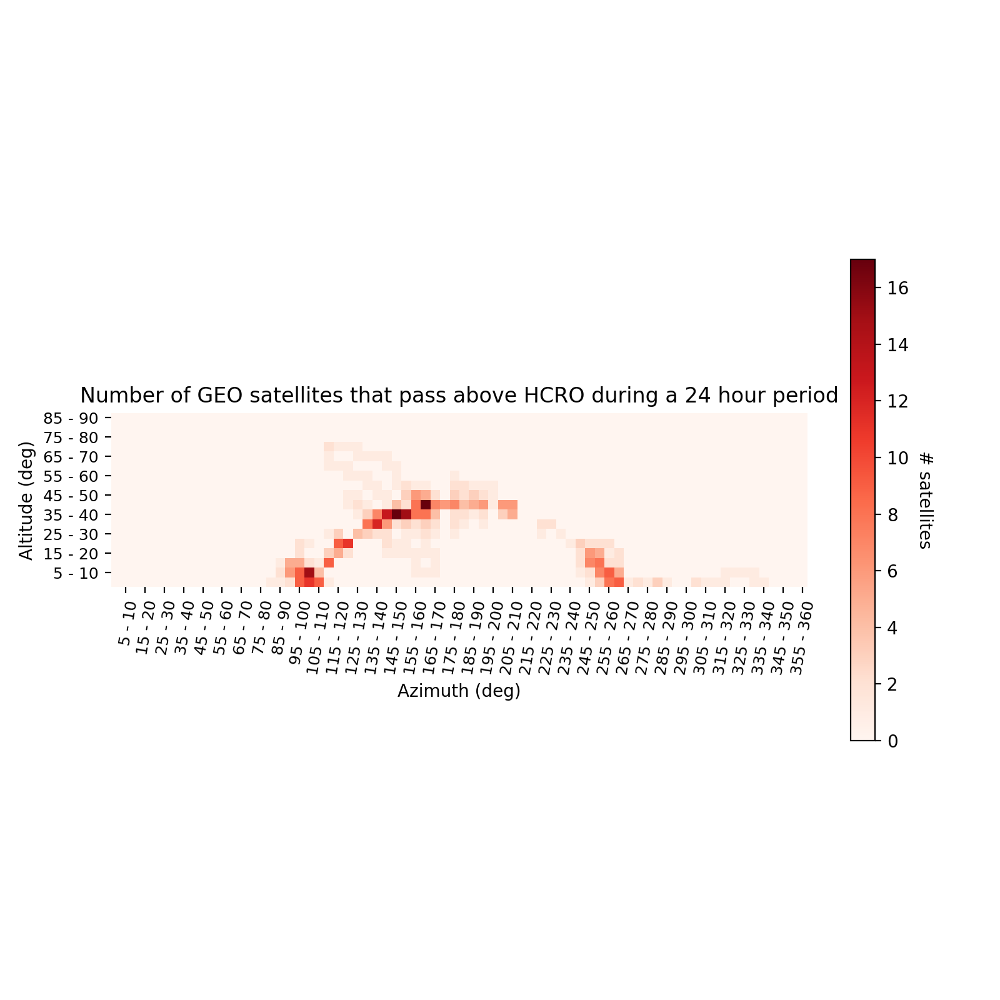

In [154]:
fig, ax = plt.subplots(figsize = (8, 8))#ax = fig.add_subplot(111, projection='mollweide')


im, cbar = heatmap(np.array(sections5geo), alt_range5f, az_range5f, ax=ax,
                   cmap="Reds", cbarlabel="# satellites")
#texts = annotate_heatmap(im, valfmt="{x:.0f}")
#uncomment out the line above if you want the text on the grids (sometimes hard to see)
plt.title('Number of GEO satellites that pass above HCRO during a 24 hour period')
plt.xticks(ticks = azs5, labels=az_range5f_label)
plt.yticks(ticks = alts5, labels = alt_range5f_label)
plt.xlabel('Azimuth (deg)')
plt.ylabel('Altitude (deg)')
fig.tight_layout()
plt.show()
#plt.savefig('5deg.jpeg')

<IPython.core.display.Javascript object>


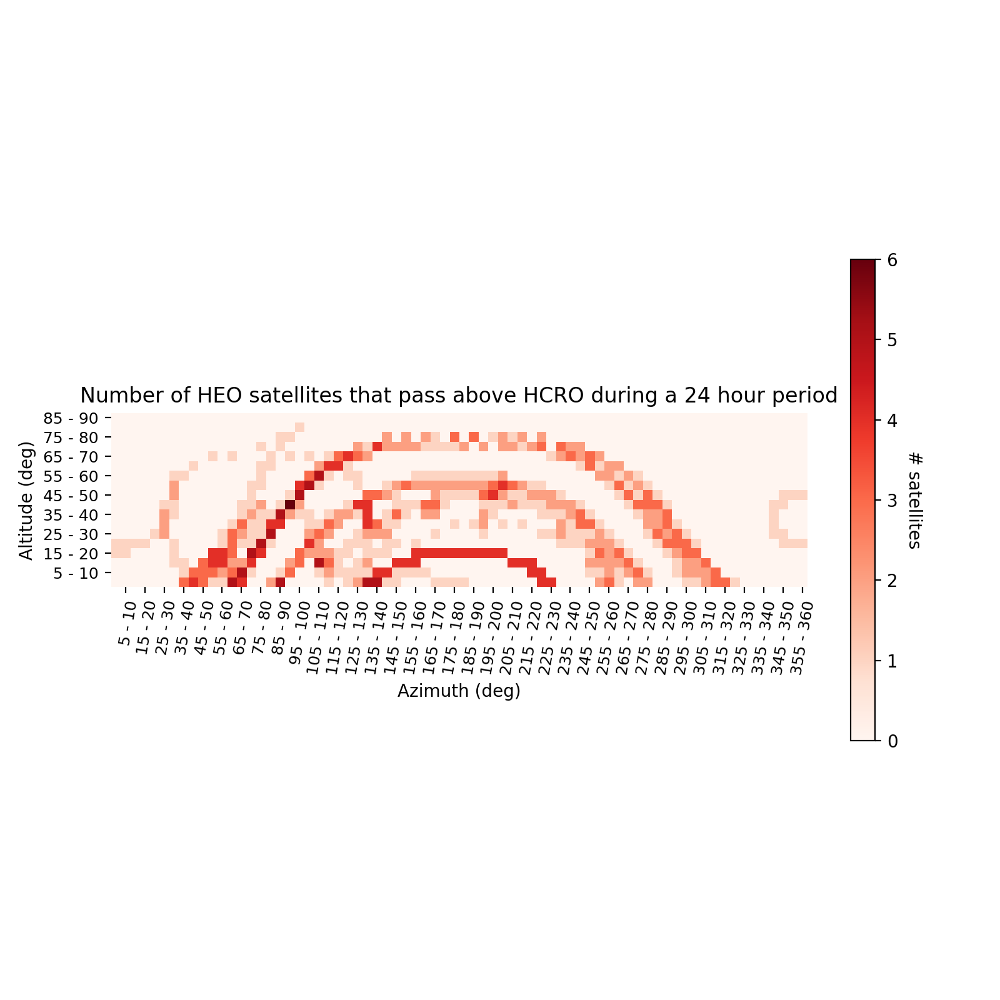

In [155]:
fig, ax = plt.subplots(figsize = (8, 8))

im, cbar = heatmap(np.array(sections5heo), alt_range5f, az_range5f, ax=ax,
                   cmap="Reds", cbarlabel="# satellites")
#texts = annotate_heatmap(im, valfmt="{x:.0f}")
#uncomment out the line above if you want the text on the grids (sometimes hard to see)
plt.title('Number of HEO satellites that pass above HCRO during a 24 hour period')
plt.xticks(ticks = azs5, labels=az_range5f_label)
plt.yticks(ticks = alts5, labels = alt_range5f_label)
plt.xlabel('Azimuth (deg)')
plt.ylabel('Altitude (deg)')
fig.tight_layout()
plt.show()
#plt.savefig('5deg.jpeg')

<IPython.core.display.Javascript object>


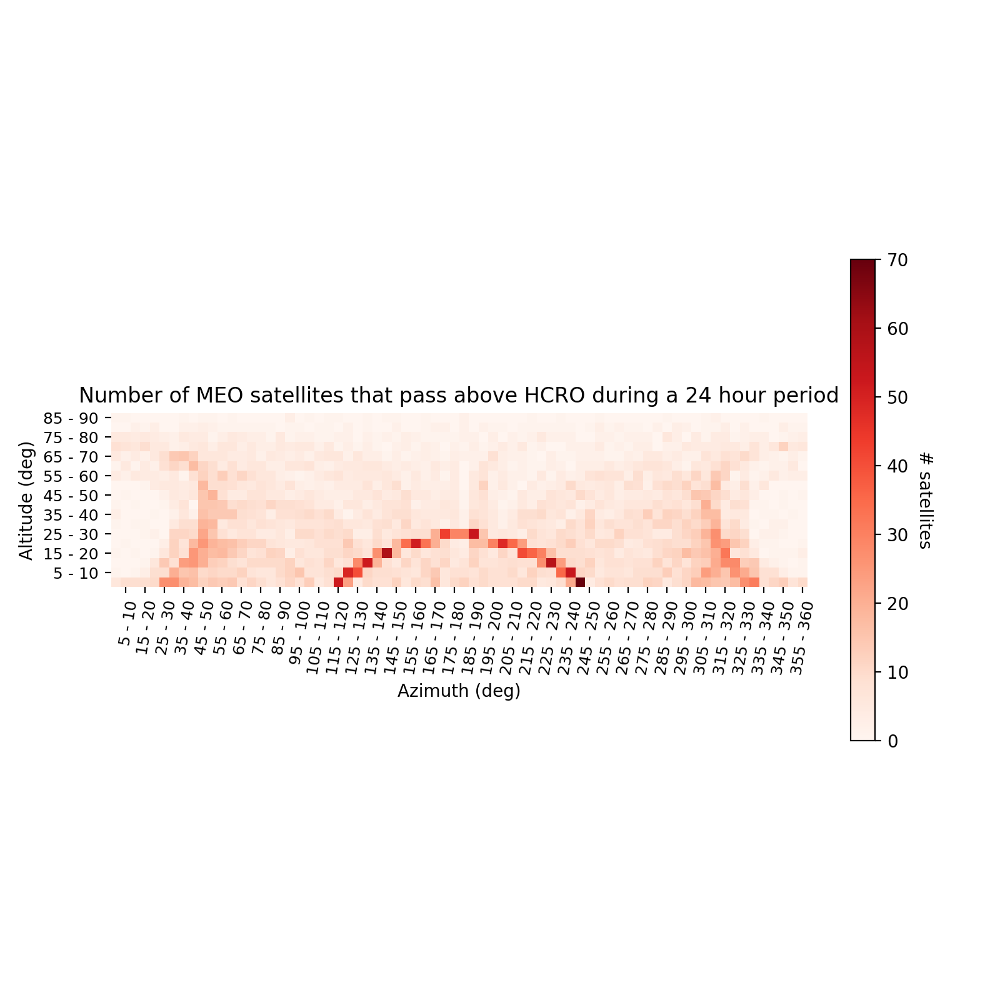

In [156]:
fig, ax = plt.subplots(figsize = (8, 8))

im, cbar = heatmap(np.array(sections5meo), alt_range5f, az_range5f, ax=ax,
                   cmap="Reds", cbarlabel="# satellites")
#texts = annotate_heatmap(im, valfmt="{x:.0f}")
#uncomment out the line above if you want the text on the grids (sometimes hard to see)
plt.title('Number of MEO satellites that pass above HCRO during a 24 hour period')
plt.xticks(ticks = azs5, labels=az_range5f_label)
plt.yticks(ticks = alts5, labels = alt_range5f_label)
plt.xlabel('Azimuth (deg)')
plt.ylabel('Altitude (deg)')
fig.tight_layout()
plt.show()
#plt.savefig('5deg.jpeg')

<IPython.core.display.Javascript object>


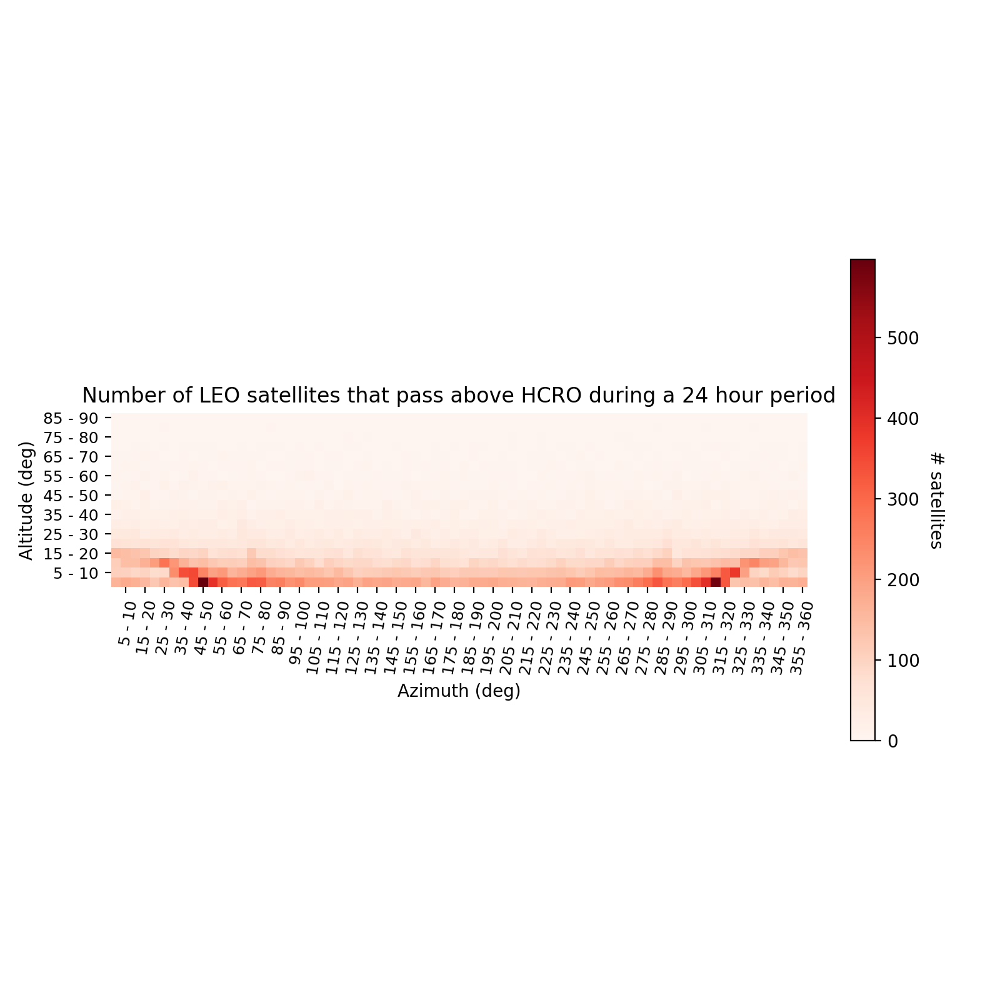

In [157]:
fig, ax = plt.subplots(figsize = (8, 8))

im, cbar = heatmap(np.array(sections5leo), alt_range5f, az_range5f, ax=ax,
                   cmap="Reds", cbarlabel="# satellites")
#texts = annotate_heatmap(im, valfmt="{x:.0f}")
#uncomment out the line above if you want the text on the grids (sometimes hard to see)
plt.title('Number of LEO satellites that pass above HCRO during a 24 hour period')
plt.xticks(ticks = azs5, labels=az_range5f_label)
plt.yticks(ticks = alts5, labels = alt_range5f_label)
plt.xlabel('Azimuth (deg)')
plt.ylabel('Altitude (deg)')
fig.tight_layout()
plt.show()
#plt.savefig('5deg.jpeg')

<IPython.core.display.Javascript object>


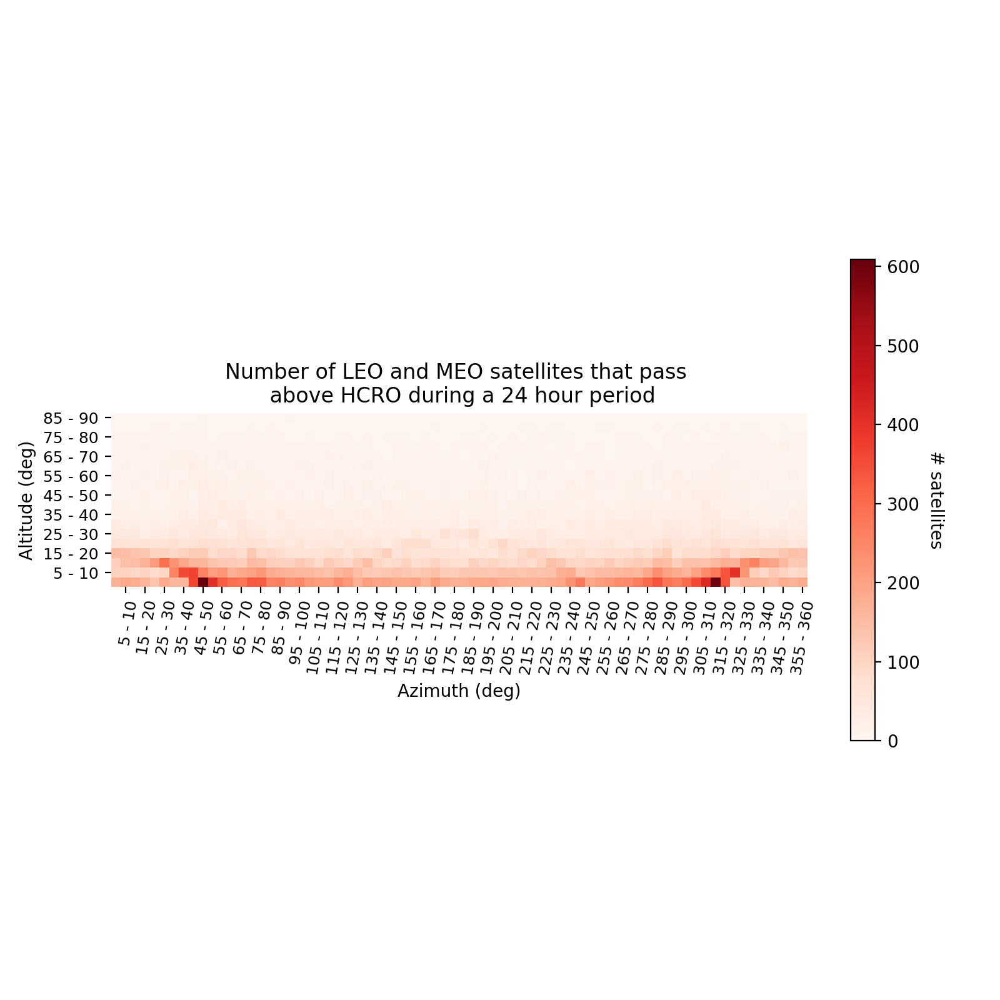

In [158]:
fig, ax = plt.subplots(figsize = (8, 8))

im, cbar = heatmap(np.array(sections5leo + sections5meo), alt_range5f, az_range5f, ax=ax,
                   cmap="Reds", cbarlabel="# satellites")
#texts = annotate_heatmap(im, valfmt="{x:.0f}")
#uncomment out the line above if you want the text on the grids (sometimes hard to see)
plt.title('Number of LEO and MEO satellites that pass \n above HCRO during a 24 hour period')
plt.xticks(ticks = azs5, labels=az_range5f_label)
plt.yticks(ticks = alts5, labels = alt_range5f_label)
plt.xlabel('Azimuth (deg)')
plt.ylabel('Altitude (deg)')
fig.tight_layout()
plt.show()
#plt.savefig('5deg.jpeg')

<IPython.core.display.Javascript object>


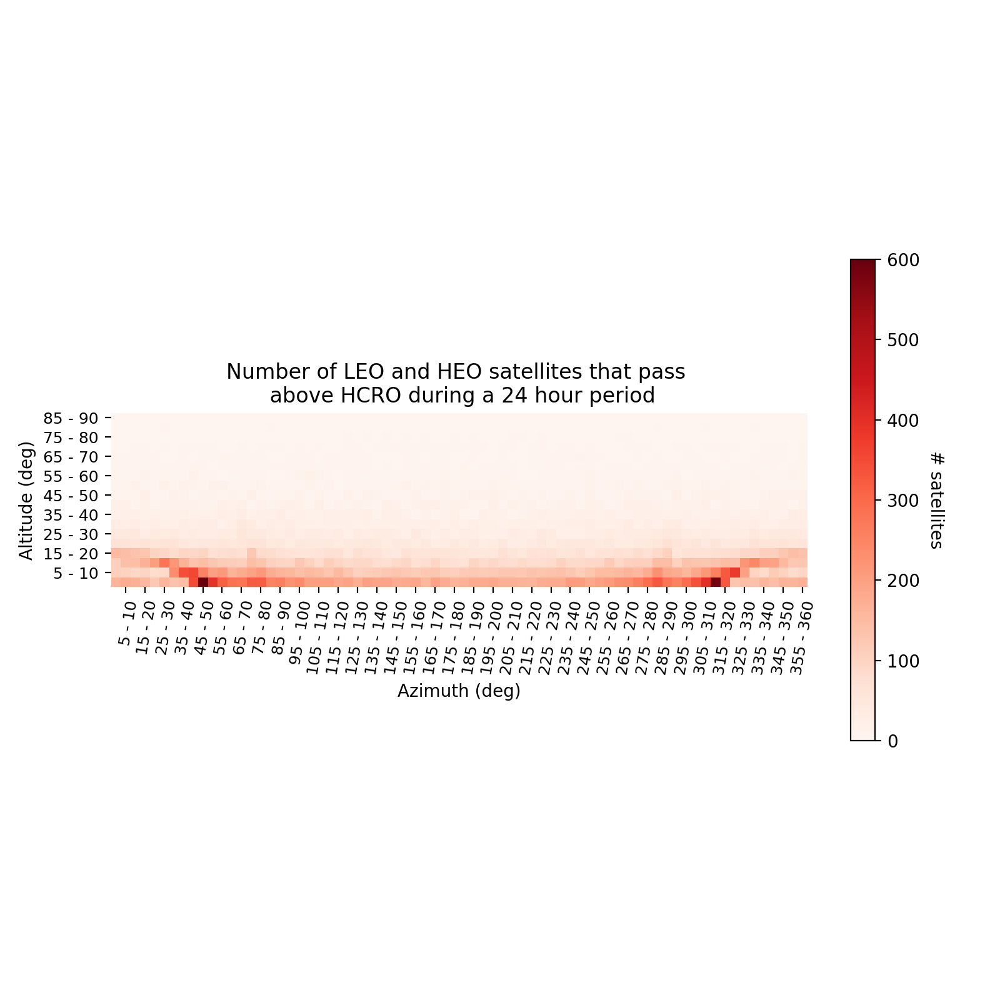

In [159]:
fig, ax = plt.subplots(figsize = (8, 8))

im, cbar = heatmap(np.array(sections5leo + sections5heo), alt_range5f, az_range5f, ax=ax,
                   cmap="Reds", cbarlabel="# satellites")
#texts = annotate_heatmap(im, valfmt="{x:.0f}")
#uncomment out the line above if you want the text on the grids (sometimes hard to see)
plt.title('Number of LEO and HEO satellites that pass \n above HCRO during a 24 hour period')
plt.xticks(ticks = azs5, labels=az_range5f_label)
plt.yticks(ticks = alts5, labels = alt_range5f_label)
plt.xlabel('Azimuth (deg)')
plt.ylabel('Altitude (deg)')
fig.tight_layout()
plt.show()
#plt.savefig('5deg.jpeg')

<IPython.core.display.Javascript object>


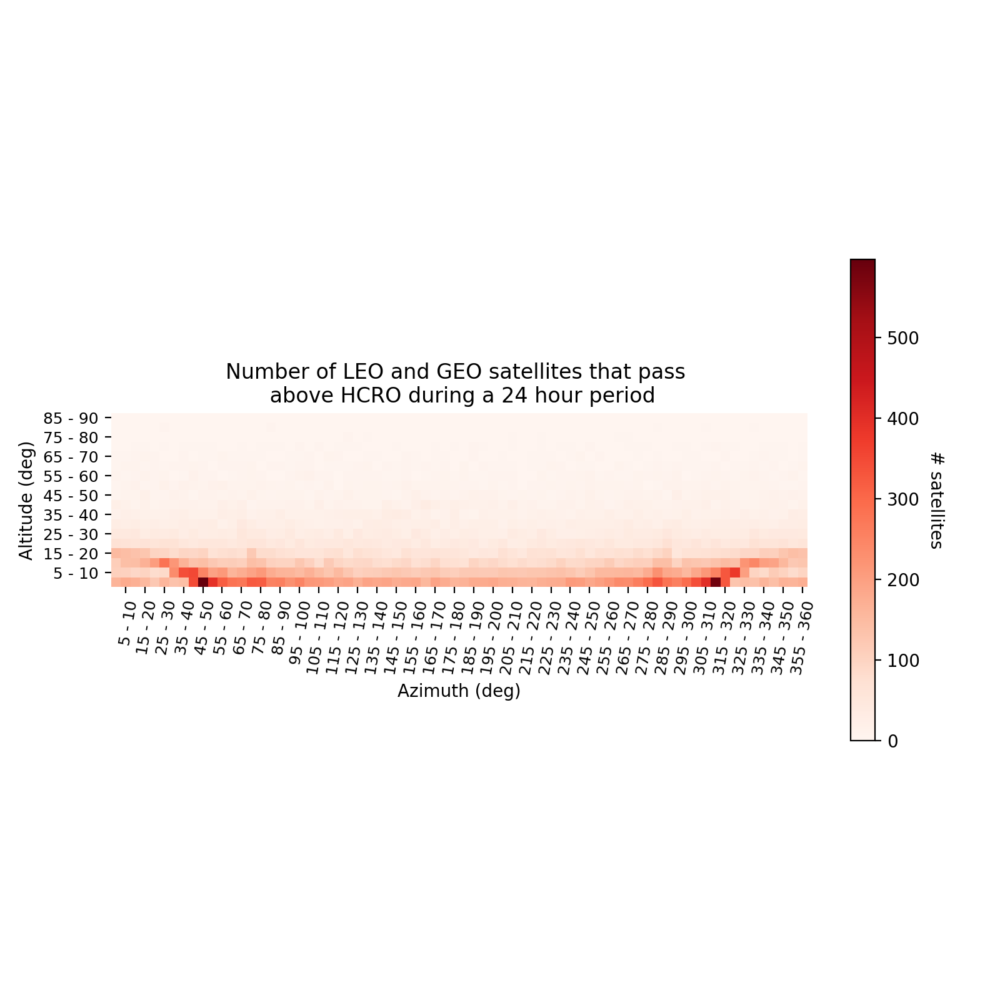

In [160]:
fig, ax = plt.subplots(figsize = (8, 8))

im, cbar = heatmap(np.array(sections5leo + sections5geo), alt_range5f, az_range5f, ax=ax,
                   cmap="Reds", cbarlabel="# satellites")
#texts = annotate_heatmap(im, valfmt="{x:.0f}")
#uncomment out the line above if you want the text on the grids (sometimes hard to see)
plt.title('Number of LEO and GEO satellites that pass \n above HCRO during a 24 hour period')
plt.xticks(ticks = azs5, labels=az_range5f_label)
plt.yticks(ticks = alts5, labels = alt_range5f_label)
plt.xlabel('Azimuth (deg)')
plt.ylabel('Altitude (deg)')
fig.tight_layout()
plt.show()
#plt.savefig('5deg.jpeg')

<IPython.core.display.Javascript object>


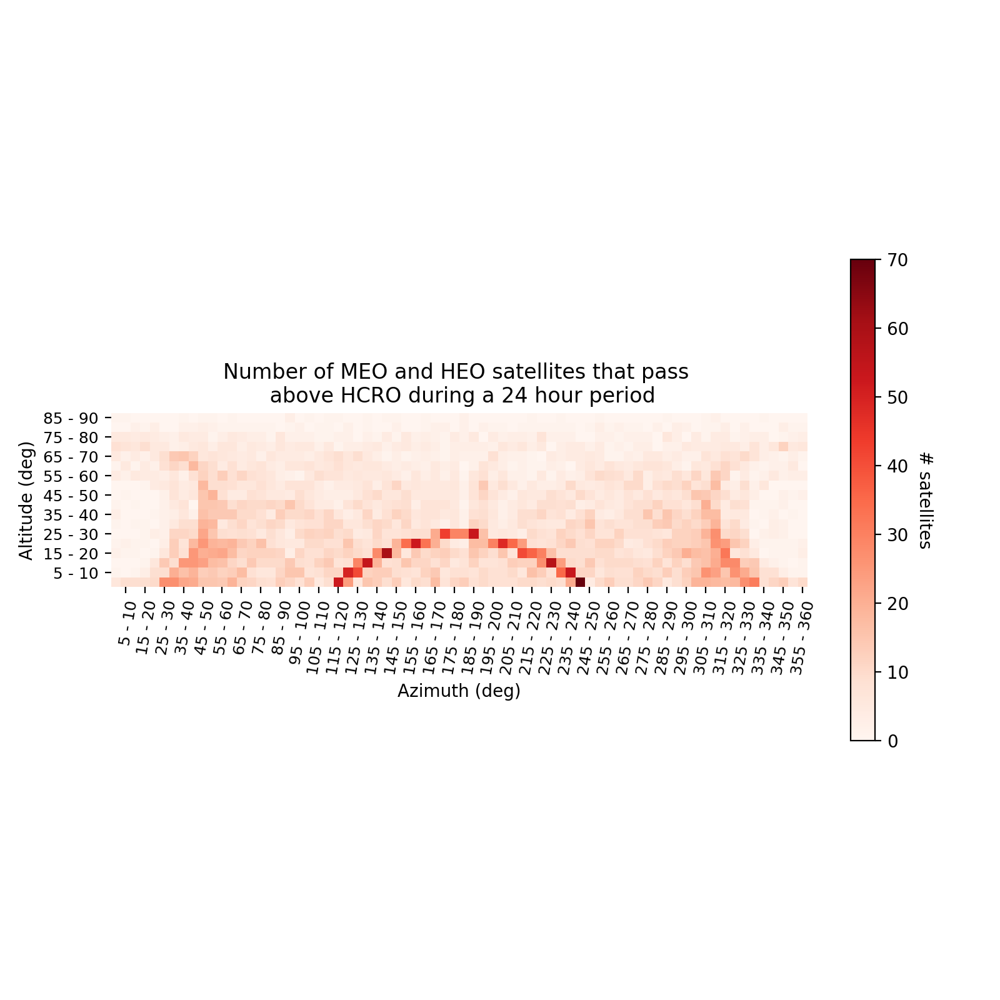

In [161]:
fig, ax = plt.subplots(figsize = (8, 8))

im, cbar = heatmap(np.array(sections5meo + sections5heo), alt_range5f, az_range5f, ax=ax,
                   cmap="Reds", cbarlabel="# satellites")
#texts = annotate_heatmap(im, valfmt="{x:.0f}")
#uncomment out the line above if you want the text on the grids (sometimes hard to see)
plt.title('Number of MEO and HEO satellites that pass \n above HCRO during a 24 hour period')
plt.xticks(ticks = azs5, labels=az_range5f_label)
plt.yticks(ticks = alts5, labels = alt_range5f_label)
plt.xlabel('Azimuth (deg)')
plt.ylabel('Altitude (deg)')
fig.tight_layout()
plt.show()
#plt.savefig('5deg.jpeg')

<IPython.core.display.Javascript object>


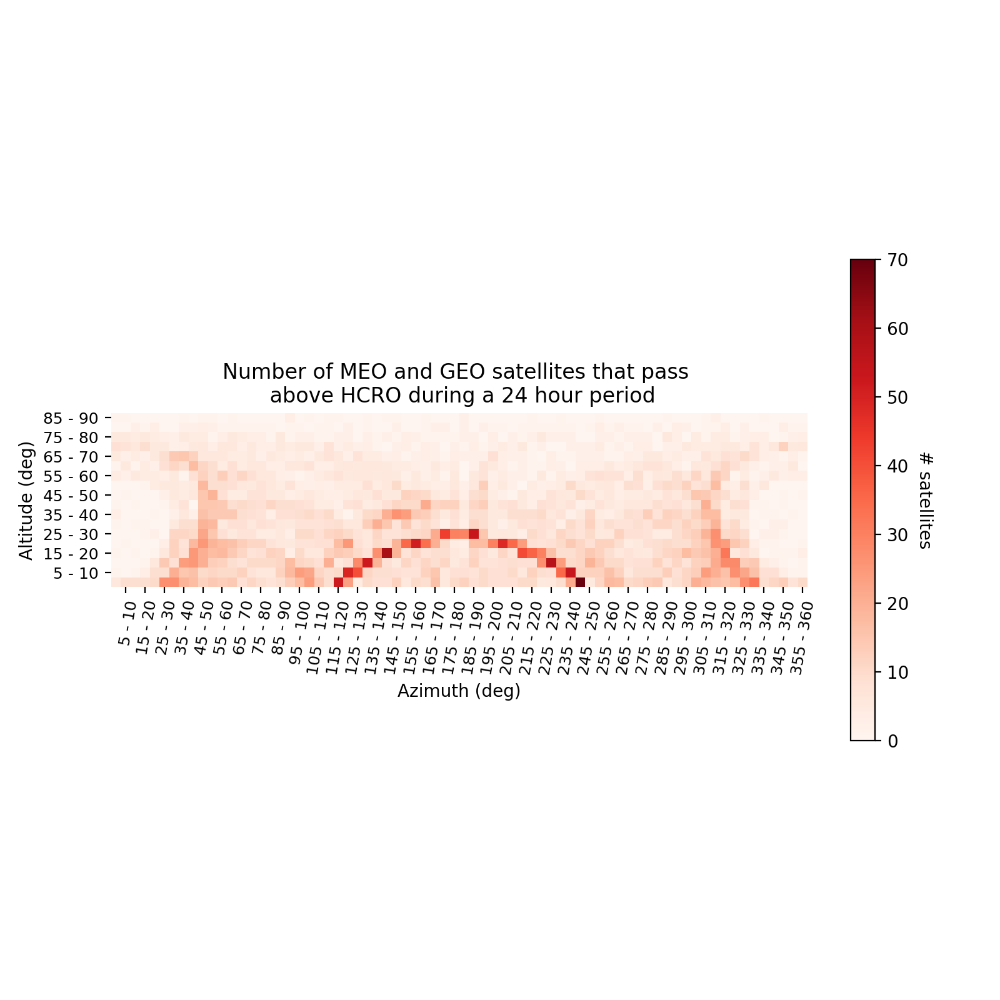

In [162]:
fig, ax = plt.subplots(figsize = (8, 8))

im, cbar = heatmap(np.array(sections5meo + sections5geo), alt_range5f, az_range5f, ax=ax,
                   cmap="Reds", cbarlabel="# satellites")
#texts = annotate_heatmap(im, valfmt="{x:.0f}")
#uncomment out the line above if you want the text on the grids (sometimes hard to see)
plt.title('Number of MEO and GEO satellites that pass \n above HCRO during a 24 hour period')
plt.xticks(ticks = azs5, labels=az_range5f_label)
plt.yticks(ticks = alts5, labels = alt_range5f_label)
plt.xlabel('Azimuth (deg)')
plt.ylabel('Altitude (deg)')
fig.tight_layout()
plt.show()
#plt.savefig('5deg.jpeg')

<IPython.core.display.Javascript object>


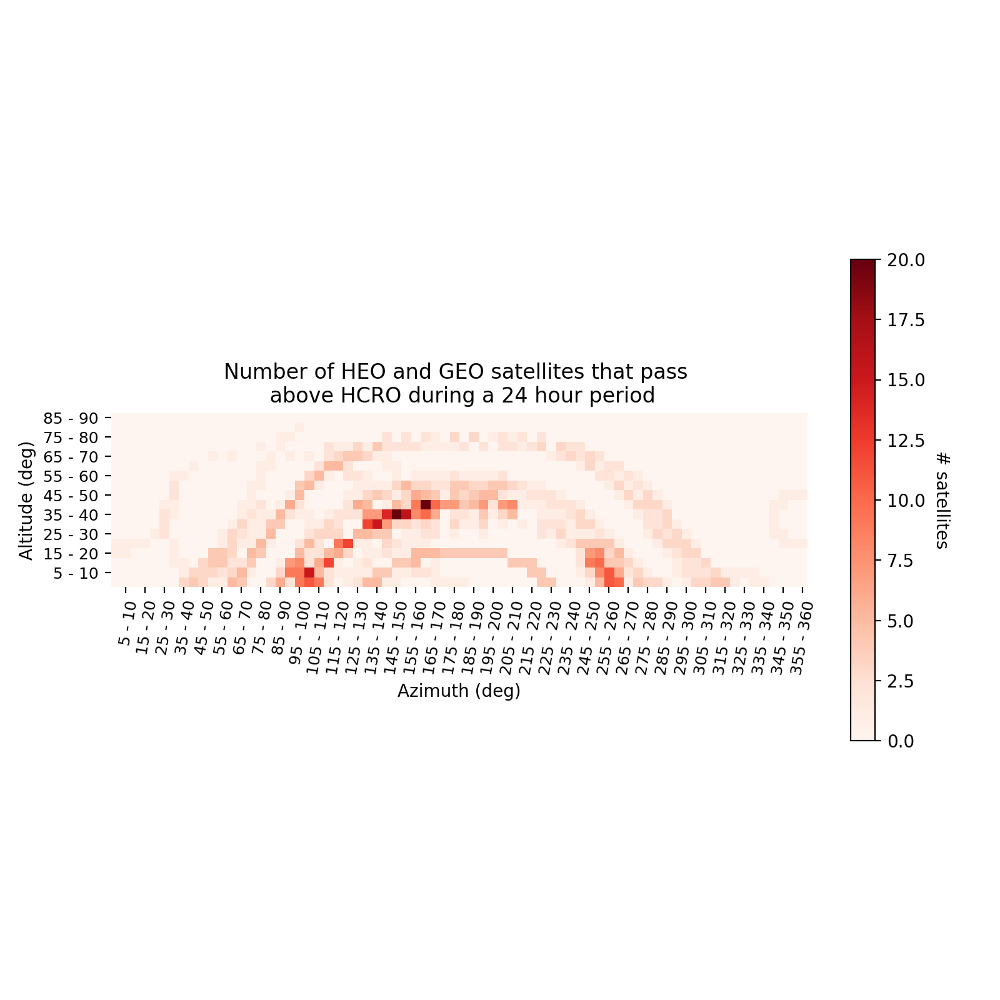

In [163]:
fig, ax = plt.subplots(figsize = (8, 8))

im, cbar = heatmap(np.array(sections5heo + sections5geo), alt_range5f, az_range5f, ax=ax,
                   cmap="Reds", cbarlabel="# satellites")
#texts = annotate_heatmap(im, valfmt="{x:.0f}")
#uncomment out the line above if you want the text on the grids (sometimes hard to see)
plt.title('Number of HEO and GEO satellites that pass \n above HCRO during a 24 hour period')
plt.xticks(ticks = azs5, labels=az_range5f_label)
plt.yticks(ticks = alts5, labels = alt_range5f_label)
plt.xlabel('Azimuth (deg)')
plt.ylabel('Altitude (deg)')
fig.tight_layout()
plt.show()
#plt.savefig('5deg.jpeg')

/var/folders/6f/jpw5cz9n6wj2vpht4vrvg0j00000gn/T/ipykernel_79839/2460181284.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize = (8, 8))


<IPython.core.display.Javascript object>


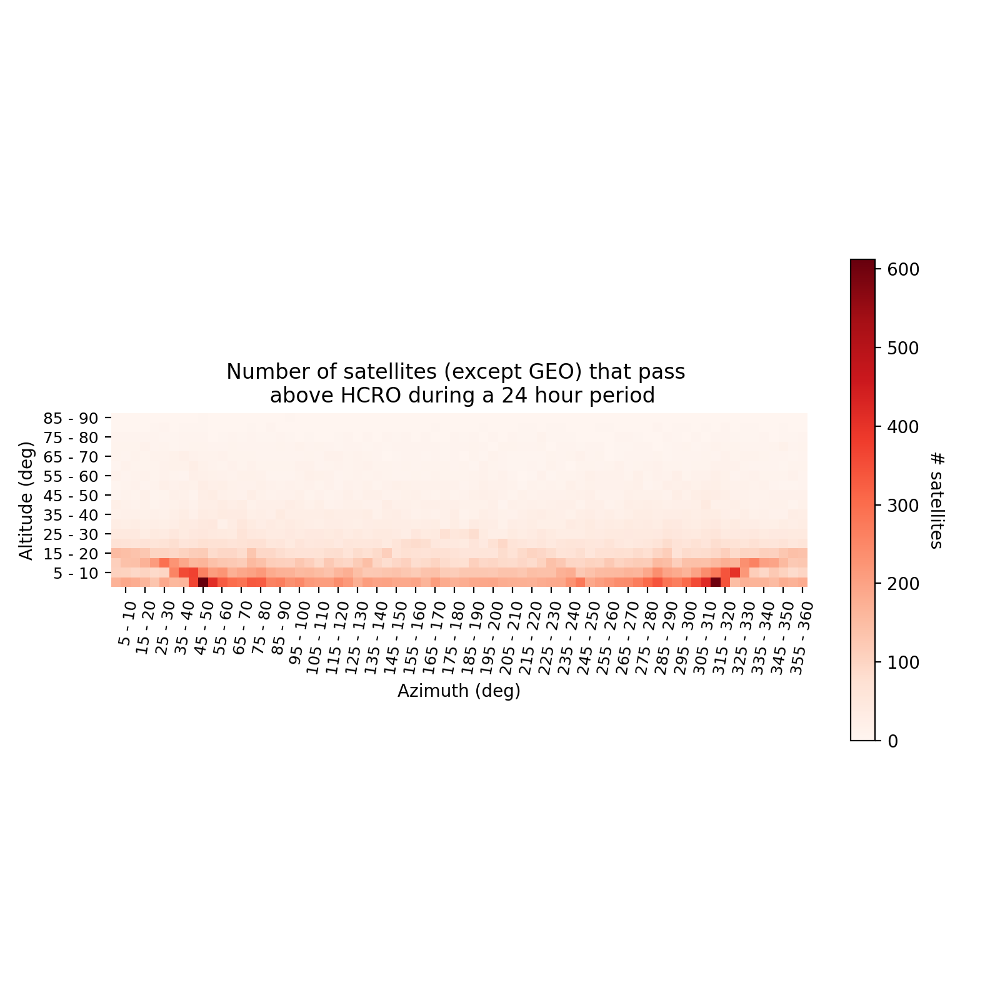

In [164]:
fig, ax = plt.subplots(figsize = (8, 8))

im, cbar = heatmap(np.array(sections5leo + sections5heo + sections5meo), alt_range5f, az_range5f, ax=ax,
                   cmap="Reds", cbarlabel="# satellites")
#texts = annotate_heatmap(im, valfmt="{x:.0f}")
#uncomment out the line above if you want the text on the grids (sometimes hard to see)
plt.title('Number of satellites (except GEO) that pass \n above HCRO during a 24 hour period')
plt.xticks(ticks = azs5, labels=az_range5f_label)
plt.yticks(ticks = alts5, labels = alt_range5f_label)
plt.xlabel('Azimuth (deg)')
plt.ylabel('Altitude (deg)')
fig.tight_layout()
plt.show()
#plt.savefig('5deg.jpeg')

<IPython.core.display.Javascript object>


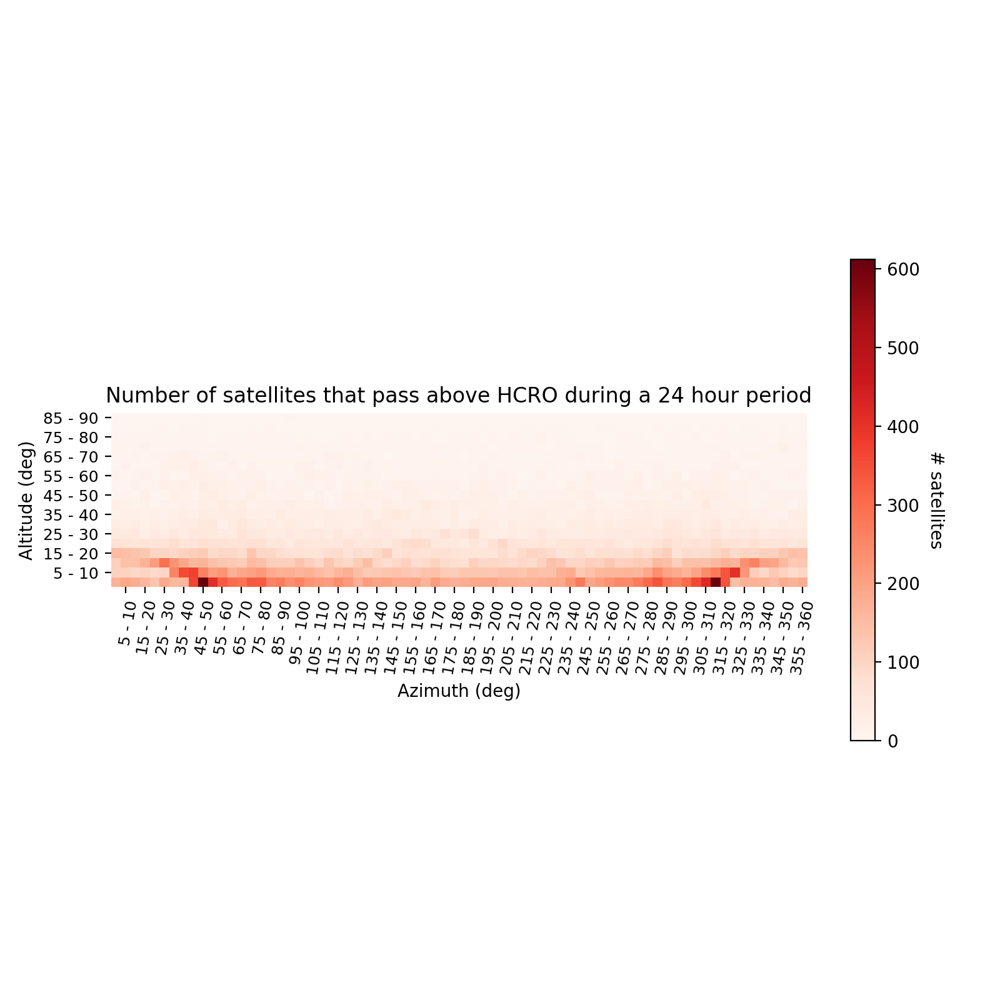

In [165]:
fig, ax = plt.subplots(figsize = (8, 8))

im, cbar = heatmap(np.array(sections5leo + sections5geo + sections5heo + sections5meo), alt_range5f, az_range5f, ax=ax,
                   cmap="Reds", cbarlabel="# satellites")
#texts = annotate_heatmap(im, valfmt="{x:.0f}")
#uncomment out the line above if you want the text on the grids (sometimes hard to see)
plt.title('Number of satellites that pass above HCRO during a 24 hour period')
plt.xticks(ticks = azs5, labels=az_range5f_label)
plt.yticks(ticks = alts5, labels = alt_range5f_label)
plt.xlabel('Azimuth (deg)')
plt.ylabel('Altitude (deg)')
fig.tight_layout()
plt.show()
#plt.savefig('5deg.jpeg')

Now making the Mollweide plots

I literally can't remember the difference between longitude and latitude, so 
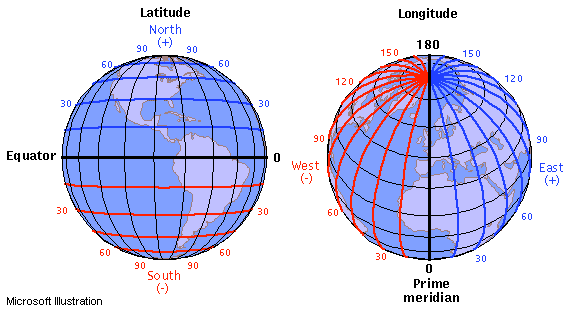

In [166]:
import healpy as hp
from healpy.newvisufunc import projview

In [167]:
alt_r = np.reshape(alt, (len(alt) * len(alt[0])))
az_r = np.reshape(az, (len(az) * len(az[0])))

In [168]:
%%time
alt_GEO = []
az_GEO = []
distance_GEO = []
alt_MEO = []
az_MEO = []
distance_MEO = []
alt_HEO = []
az_HEO = []
distance_HEO = []
alt_LEO = []
az_LEO = []
distance_LEO = []
for i in range(len(alt)):
    #print(i)
    for j in range(len(GEO)):
        if i == GEO[j]:
            for k in range(len(t)):
                if alt[i][k] > 0:
                    alt_GEO.append(np.abs(alt[i][k] - 90))
                    az_GEO.append(az[i][k])
                    distance_GEO.append(distance[i][k])
for i in range(len(alt)):
    for j in range(len(MEO)):
        if i == MEO[j]:
            for k in range(len(t)):
                if alt[i][k] > 0:
                    alt_MEO.append(np.abs(alt[i][k] - 90))
                    az_MEO.append(az[i][k])
                    distance_MEO.append(distance[i][k])
                
for i in range(len(alt)):
    for j in range(len(HEO)):
        if i == HEO[j]:
            for k in range(len(t)):
                if alt[i][k] > 0:
                    alt_HEO.append(np.abs(alt[i][k] - 90))
                    az_HEO.append(az[i][k])
                    distance_HEO.append(distance[i][k])
                
for i in range(len(alt)):
    for j in range(len(LEO)):
        if i == LEO[j]:
            for k in range(len(t)):
                if alt[i][k] > 0:
                    alt_LEO.append(np.abs(alt[i][k] - 90))
                    az_LEO.append(az[i][k])
                    distance_LEO.append(distance[i][k])


CPU times: user 3.48 s, sys: 72.8 ms, total: 3.55 s
Wall time: 3.56 s


In [169]:
data = [np.arange(len(alt_HEO)),np.arange(len(alt_GEO)), np.arange(len(alt_MEO)), np.arange(len(alt_LEO))]
theta = [np.radians(alt_HEO), np.radians(alt_GEO), np.radians(alt_MEO), np.radians(alt_LEO)]
phi = [np.radians(az_HEO), np.radians(az_GEO), np.radians(az_MEO), np.radians(az_LEO)]


In [170]:
nside = 2**6

In [171]:
(hp.nside2resol(nside) * u.rad).to(u.degree)
#Angular resolution of the Mollweide plot

<Quantity 0.91612971 deg>

In [172]:
#Changing the az so we can look due South (so the Mollweide plots show the same shape as the 
#2D plots)
for i in range(len(phi[0])):
    if (phi[0][i] + np.pi) >= (2*np.pi):
        phi[0][i] = phi[0][i] - np.pi
    elif (phi[0][i] + np.pi) < (2*np.pi):
        phi[0][i] = phi[0][i] + np.pi

for i in range(len(phi[1])):
    if (phi[1][i] + np.pi) >= (2*np.pi):
        phi[1][i] = phi[1][i] - np.pi
    elif (phi[1][i] + np.pi) < (2*np.pi):
        phi[1][i] = phi[1][i] + np.pi

for i in range(len(phi[2])):
    if (phi[2][i] + np.pi) >= (2*np.pi):
        phi[2][i] = phi[2][i] - np.pi
    elif (phi[2][i] + np.pi) < (2*np.pi):
        phi[2][i] = phi[2][i] + np.pi
        
for i in range(len(phi[3])):
    if (phi[3][i] + np.pi) >= (2*np.pi):
        phi[3][i] = phi[3][i] - np.pi
    elif (phi[3][i] + np.pi) < (2*np.pi):
        phi[3][i] = phi[3][i] + np.pi

In [173]:
pixel_indices_heo = hp.ang2pix(nside, theta[0], phi[0])
pixel_indices_geo = hp.ang2pix(nside, theta[1], phi[1])
pixel_indices_meo = hp.ang2pix(nside, theta[2], phi[2])
pixel_indices_leo = hp.ang2pix(nside, theta[3], phi[3])

In [174]:
ph = hp.ang2pix(nside, theta[0], phi[0])
pg = hp.ang2pix(nside, theta[1], phi[1])
pm = hp.ang2pix(nside, theta[2], phi[2])
pl = hp.ang2pix(nside, theta[3], phi[3])

In [176]:
#Correcting for geo satellites being in the same place
for i in range(len(pixel_indices_geo)-1):
    if pg[i] == pg[i+1]:
        pixel_indices_geo[i+1] = 0
        
for i in range(len(pixel_indices_heo)-1):
    if ph[i] == ph[i+1]:
        pixel_indices_heo[i+1] = 0
        
for i in range(len(pixel_indices_meo)-1):
    if pm[i] == pm[i+1]:
        pixel_indices_meo[i+1] = 0
        
for i in range(len(pixel_indices_leo)-1):
    if pl[i] == pl[i+1]:
        pixel_indices_leo[i+1] = 0

In [177]:
mheo = np.zeros(hp.nside2npix(nside))
mgeo = np.zeros(hp.nside2npix(nside))
mmeo = np.zeros(hp.nside2npix(nside))
mleo = np.zeros(hp.nside2npix(nside))


In [178]:
%%time
#takes about 7 minutes
for i in range(1, len(mheo)):
    for j in range(len(pixel_indices_heo)):
        if i == pixel_indices_heo[j]:
            mheo[i] += 1
            
for i in range(1, len(mgeo)):
    for j in range(len(pixel_indices_geo)):
        if i == pixel_indices_geo[j]:
            mgeo[i] += 1
            
for i in range(1, len(mmeo)):
    for j in range(len(pixel_indices_meo)):
        if i == pixel_indices_meo[j]:
            mmeo[i] += 1
            
for i in range(1, len(mleo)):
    for j in range(len(pixel_indices_leo)):
        if i == pixel_indices_leo[j]:
            mleo[i] += 1

CPU times: user 6min 33s, sys: 6.1 s, total: 6min 39s
Wall time: 11min 15s


In [179]:
m = []
for i in range(len(mheo)):
    m.append(mheo[i]+mgeo[i]+mleo[i]+mmeo[i])

<IPython.core.display.Javascript object>


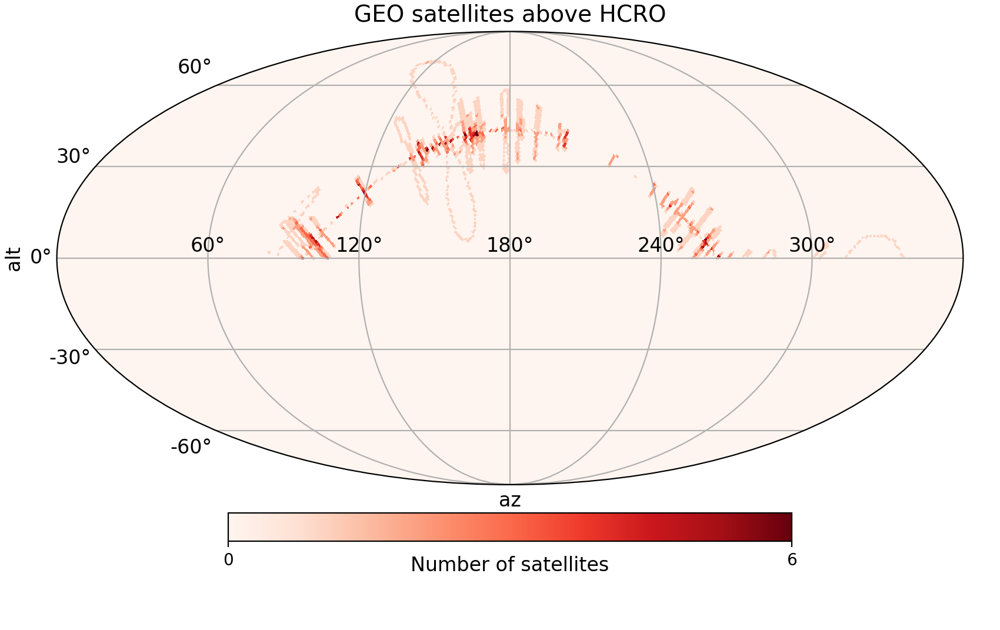

In [180]:
projview(
    mgeo,
    coord=["G"],
    graticule=True,
    flip = 'geo',
    graticule_labels=True,
    unit="Number of satellites",
    xlabel="az",
    ylabel="alt",
    cb_orientation="horizontal",
    projection_type="mollweide",
    cmap = "Reds",
    title = 'GEO satellites above HCRO',
    #phi_convention = 'counterclockwise',
    custom_xtick_labels = ['60°', '120°', '180°', '240°', '300°'],
);


<IPython.core.display.Javascript object>


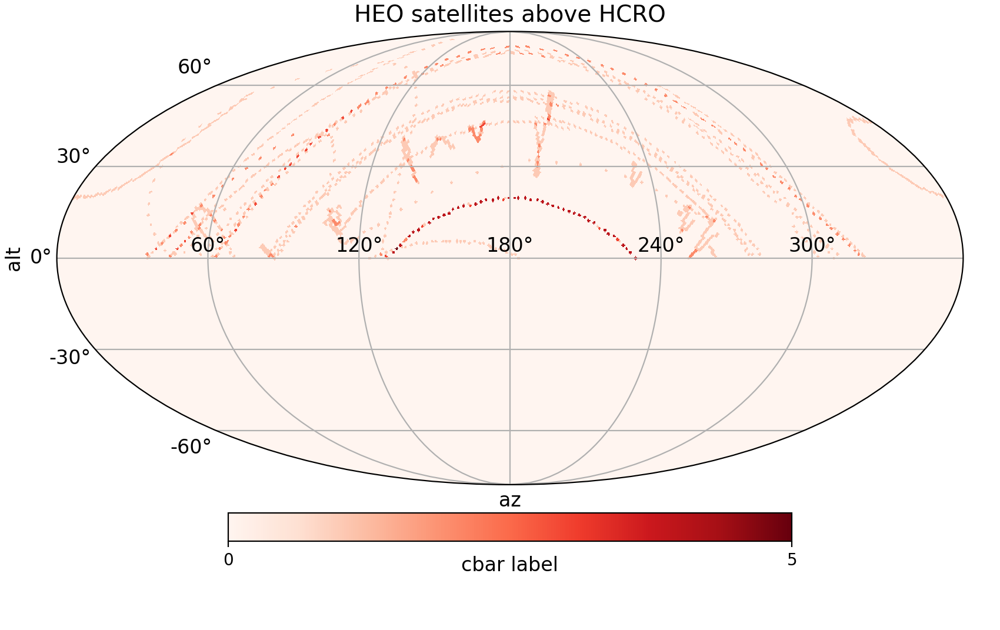

In [181]:
projview(
    mheo,
    coord=["G"],
    graticule=True,
    flip = 'geo',
    graticule_labels=True,
    unit="cbar label",
    xlabel="az",
    ylabel="alt",
    cb_orientation="horizontal",
    projection_type="mollweide",
    cmap = "Reds",
    title = 'HEO satellites above HCRO',
    phi_convention = 'clockwise',
    custom_xtick_labels = ['60°', '120°', '180°', '240°', '300°'],
);


<IPython.core.display.Javascript object>


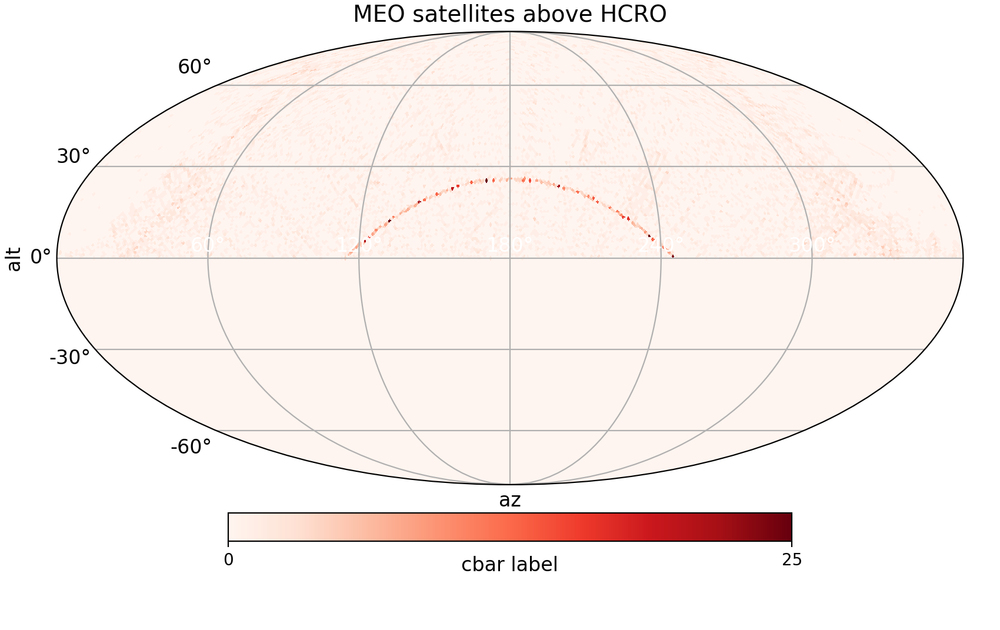

In [182]:
projview(
    mmeo,
    coord=["G"],
    graticule=True,
    flip = 'geo',
    graticule_labels=True,
    unit="cbar label",
    xlabel="az",
    ylabel="alt",
    cb_orientation="horizontal",
    projection_type="mollweide",
    cmap = "Reds",
    title = 'MEO satellites above HCRO',
    phi_convention = 'clockwise',
    custom_xtick_labels = ['60°', '120°', '180°', '240°', '300°'],
    xtick_label_color = 'white',
);


<IPython.core.display.Javascript object>


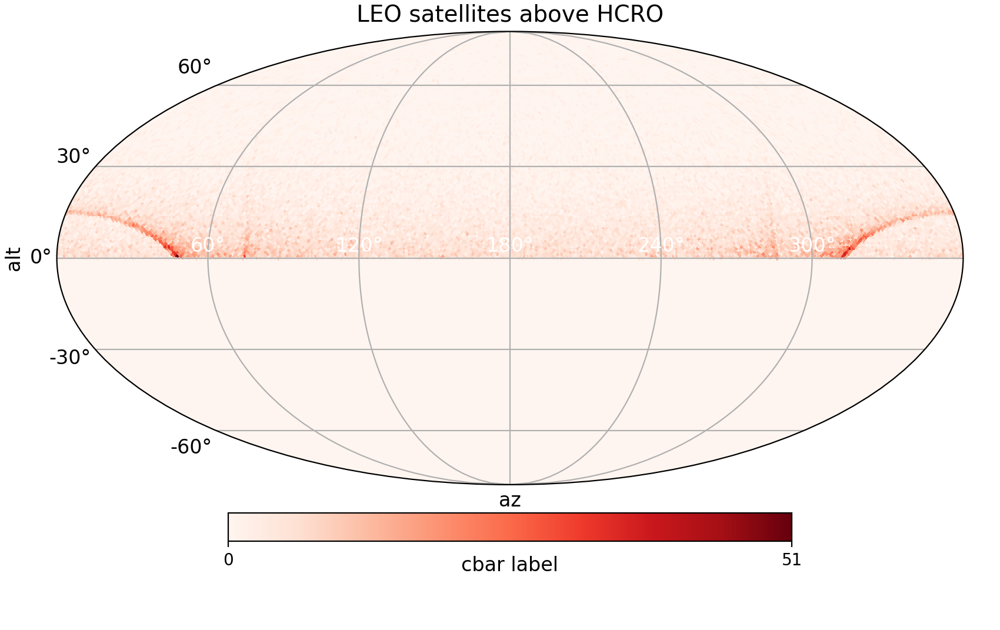

In [183]:
projview(
    mleo,
    coord=["G"],
    graticule=True,
    flip = 'geo',
    graticule_labels=True,
    unit="cbar label",
    xlabel="az",
    ylabel="alt",
    cb_orientation="horizontal",
    projection_type="mollweide",
    cmap = "Reds",
    title = 'LEO satellites above HCRO',
    phi_convention = 'clockwise',
    custom_xtick_labels = ['60°', '120°', '180°', '240°', '300°'],
    xtick_label_color = 'white',
);


<IPython.core.display.Javascript object>


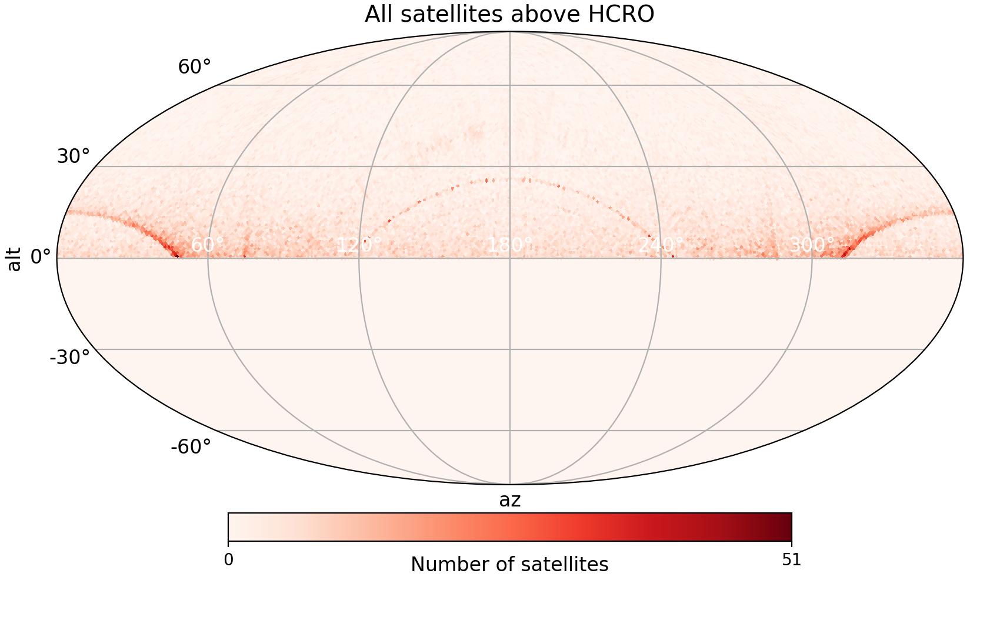

In [184]:
projview(
    np.array(m),
    coord=["G"],
    graticule=True,
    flip = 'geo',
    graticule_labels=True,
    unit="Number of satellites",
    xlabel="az",
    ylabel="alt",
    cb_orientation="horizontal",
    projection_type="mollweide",
    cmap = "Reds",
    title = 'All satellites above HCRO',
    phi_convention = 'clockwise',
    custom_xtick_labels = ['60°', '120°', '180°', '240°', '300°'],
    xtick_label_color = 'white',
);


Frequency scraping

In [226]:
import csv
name = []
freq = []
bandwidth = []
id_sc = []
with open('SatList.csv', newline='') as csvfile:
    reader = csv.DictReader(csvfile)
    for row in reader:
        name.append(row['Name'])
        freq.append(row['Frequency [MHz]'])
        bandwidth.append(row['Bandwidth [kHz]/Baud'])
        id_sc.append(row["ID"])

In [236]:
name_s = []
freq_s = []
bandwidth_s = []
id_s = []
n = []
h = []
for i in range(len(line2)):
    for j in range(len(id_sc)):
        try:
            if int(line2[i][2:7]) == int(id_sc[j]):
               # print(i, j)
                name_s.append(name[j])
                freq_s.append(freq[j])
                if bandwidth[j] == 'None':
                    bandwidth_s.append(0)
                else:
                    for k in range(len(bandwidth[j])):
                        try:
                            bandwidth_s.append(float(bandwidth[j][:-k]))
                            break
                        except:
                            pass
                id_s.append(line2[i][2:7])
                n.append(i) #active
                h.append(j) #scraping
        except:
            pass

In [238]:
%%time
GEO_freq = [] #GHz
HEO_freq = [] #GHz
MEO_freq = [] #GHz
LEO_freq = [] #GHz
ngeo = []
nheo = []
nmeo = []
nleo = []
for i in range(len(n)):
    if freq_s[i][-1] != 'x' and freq_s[i][-1] != 'z':
        for k in range(len(GEO)):
            if GEO[k] == n[i]:
                GEO_freq.append(float(freq_s[i]) * 0.001)
                ngeo.append(GEO[k])
        for k in range(len(HEO)):
            if HEO[k] == n[i]:
                HEO_freq.append(float(freq_s[i]) * 0.001)
                nheo.append(HEO[k])
        for k in range(len(MEO)):
            if MEO[k] == n[i]:
                MEO_freq.append(float(freq_s[i]) * 0.001)
                nmeo.append(MEO[k])
        for k in range(len(LEO)):
            if LEO[k] == n[i]:
                LEO_freq.append(float(freq_s[i]) * 0.001)
                nleo.append(LEO[k])
    elif freq_s[i][-1] == 'x':
        for k in range(len(GEO)):
            if GEO[k] == n[i]:
                GEO_freq.append(float(freq_s[i][:-4]) * 0.001)
                ngeo.append(GEO[k])
        for k in range(len(HEO)):
            if HEO[k] == n[i]:
                HEO_freq.append(float(freq_s[i][:-4]) * 0.001)
                nheo.append(HEO[k])
        for k in range(len(MEO)):
            if MEO[k] == n[i]:
                MEO_freq.append(float(freq_s[i][:-4]) * 0.001)
                nmeo.append(MEO[k])
        for k in range(len(LEO)):
            if LEO[k] == n[i]:
                LEO_freq.append(float(freq_s[i][:-4]) * 0.001)
                nleo.append(LEO[k])
    elif freq_s[i][-1] == 'z':
        for k in range(len(GEO)):
            if GEO[k] == n[i]:
                GEO_freq.append(float(freq_s[i][:-3]))
                ngeo.append(GEO[k])
        for k in range(len(HEO)):
            if HEO[k] == n[i]:
                HEO_freq.append(float(freq_s[i][:-3]))
                nheo.append(HEO[k])
        for k in range(len(MEO)):
            if MEO[k] == n[i]:
                MEO_freq.append(float(freq_s[i][:-3]))
                nmeo.append(MEO[k])
        for k in range(len(LEO)):
            if LEO[k] == n[i]:
                LEO_freq.append(float(freq_s[i][:-3]))
                nleo.append(LEO[k])

CPU times: user 1.1 s, sys: 18.7 ms, total: 1.12 s
Wall time: 1.12 s


The ATA looks from 1-14 GHz ([SETI](https://www.seti.org/seti-allen-telescope-array-ata#:~:text=While%20it%20is%20not%20the,from%20approximately%201%20%E2%80%93%2014%20GHz.))

In [240]:
fgeo = []
fmeo = []
fheo = []
fleo = []
sgeo = []
smeo = []
sheo = []
sleo = []
for i in range(1, 14):

    for j in range(len(GEO_freq)):
        if i <= GEO_freq[j] < (i+1):
            fgeo.append(i)
            sgeo.append(j)

    for j in range(len(MEO_freq)):
        if i <= MEO_freq[j] < (i+1):
            fmeo.append(i)
            smeo.append(j)
            
    for j in range(len(HEO_freq)):
        if i <= HEO_freq[j] < (i+1):
            fheo.append(i)
            sheo.append(j)

    for j in range(len(LEO_freq)):
        if i <= LEO_freq[j] < (i+1):
            fleo.append(i)
            sleo.append(j)

Making plots of the frequency distribution of the satellites

In [241]:
ngeo = []
nmeo = []
nheo = []
nleo = []
nall = []
x = []

for i in range(1, 14):
    ngeo.append(fgeo.count(i))
    nmeo.append(fmeo.count(i))
    nheo.append(fheo.count(i))
    nleo.append(fleo.count(i))
    nall.append(ngeo[-1] + nmeo[-1] + nheo[-1] + nleo[-1])
    x.append(i+0.5)

<IPython.core.display.Javascript object>


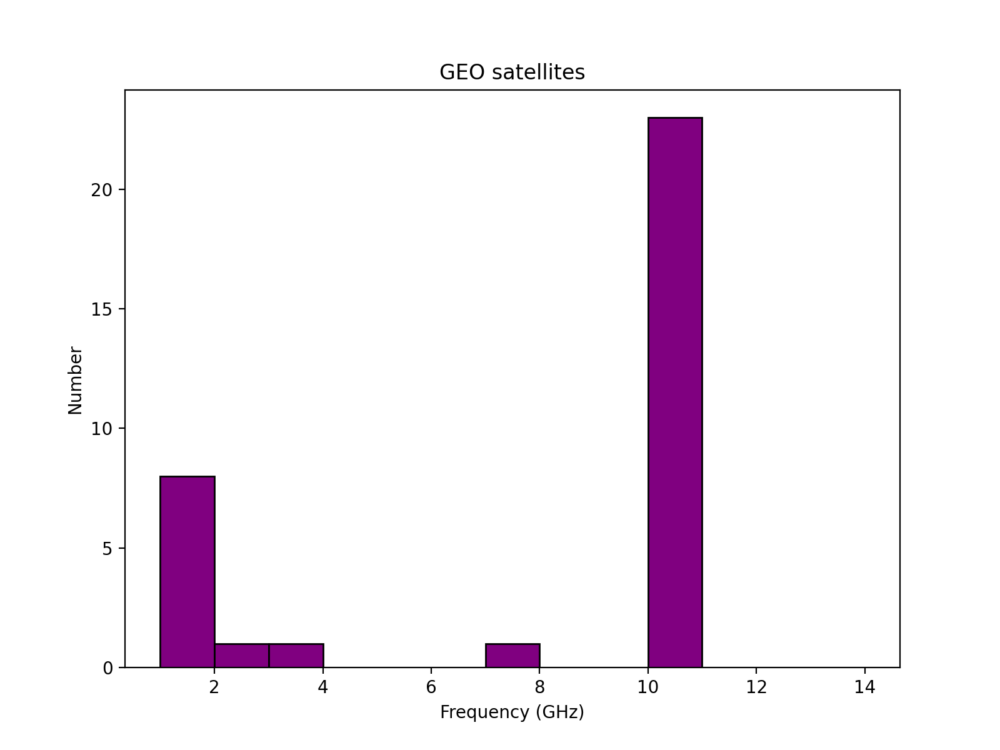

In [242]:
plt.figure(figsize = (8, 6))
plt.bar(x, ngeo, width = 1, color = 'purple', edgecolor = 'k')
plt.title('GEO satellites')
plt.xlabel('Frequency (GHz)')
plt.ylabel('Number')
plt.show()

<IPython.core.display.Javascript object>


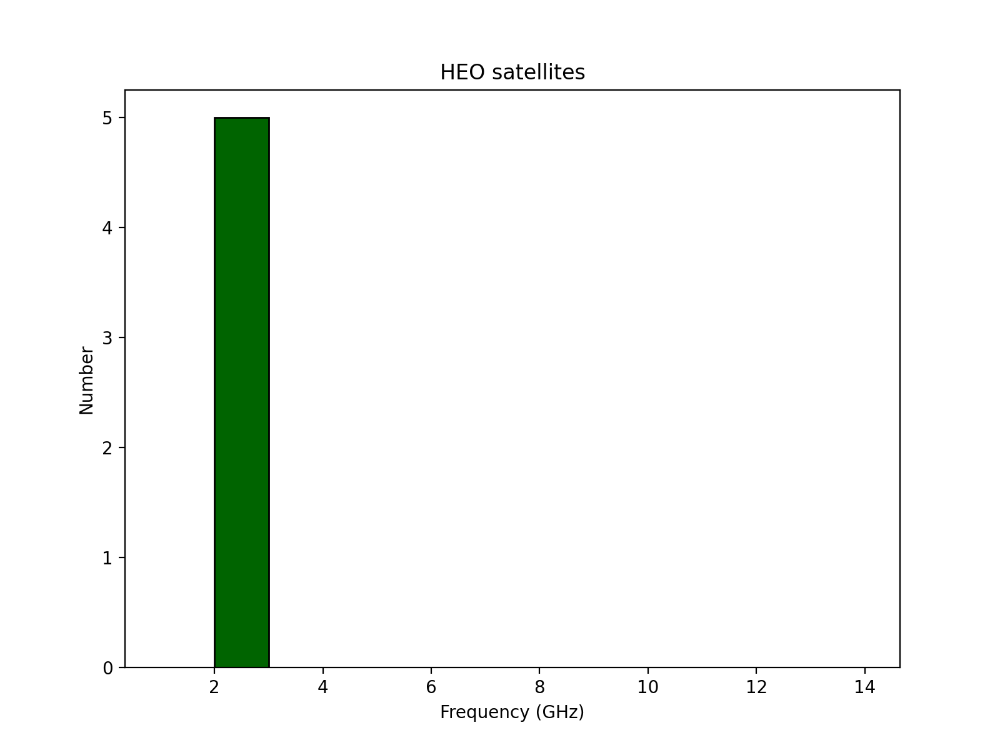

In [243]:
plt.figure(figsize = (8, 6))
plt.bar(x, nheo, width = 1, color = 'darkgreen', edgecolor = 'k')
plt.title('HEO satellites')
plt.xlabel('Frequency (GHz)')
plt.ylabel('Number')
plt.show()

<IPython.core.display.Javascript object>


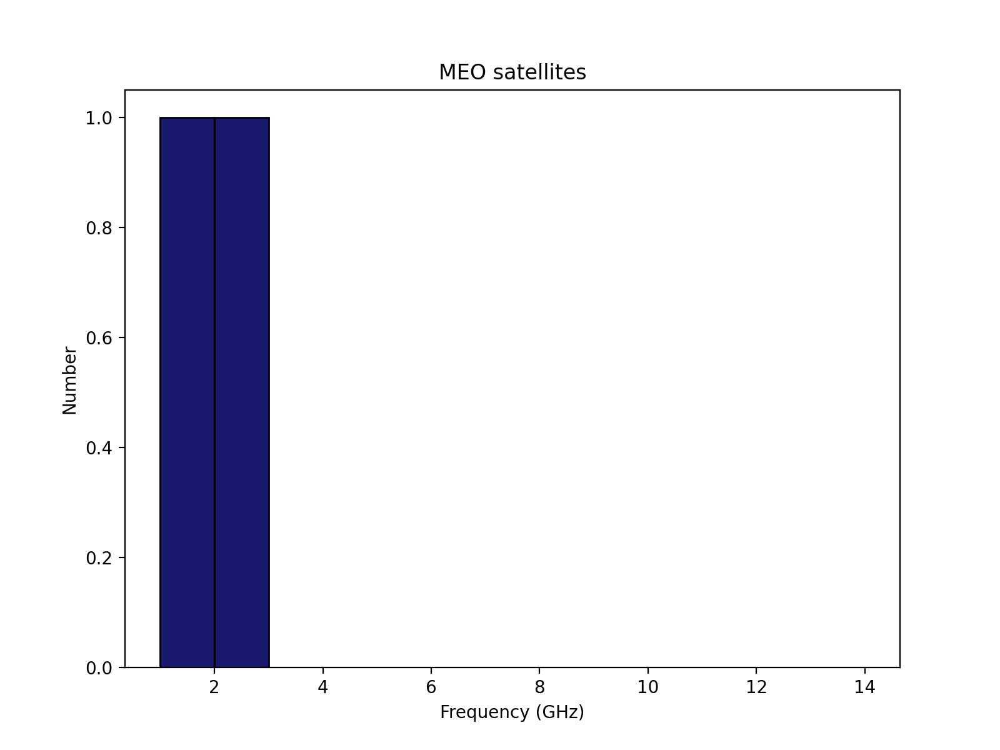

In [244]:
plt.figure(figsize = (8, 6))
plt.bar(x, nmeo, width = 1, color = 'midnightblue', edgecolor = 'k')
plt.title('MEO satellites')
plt.xlabel('Frequency (GHz)')
plt.ylabel('Number')
plt.show()

<IPython.core.display.Javascript object>


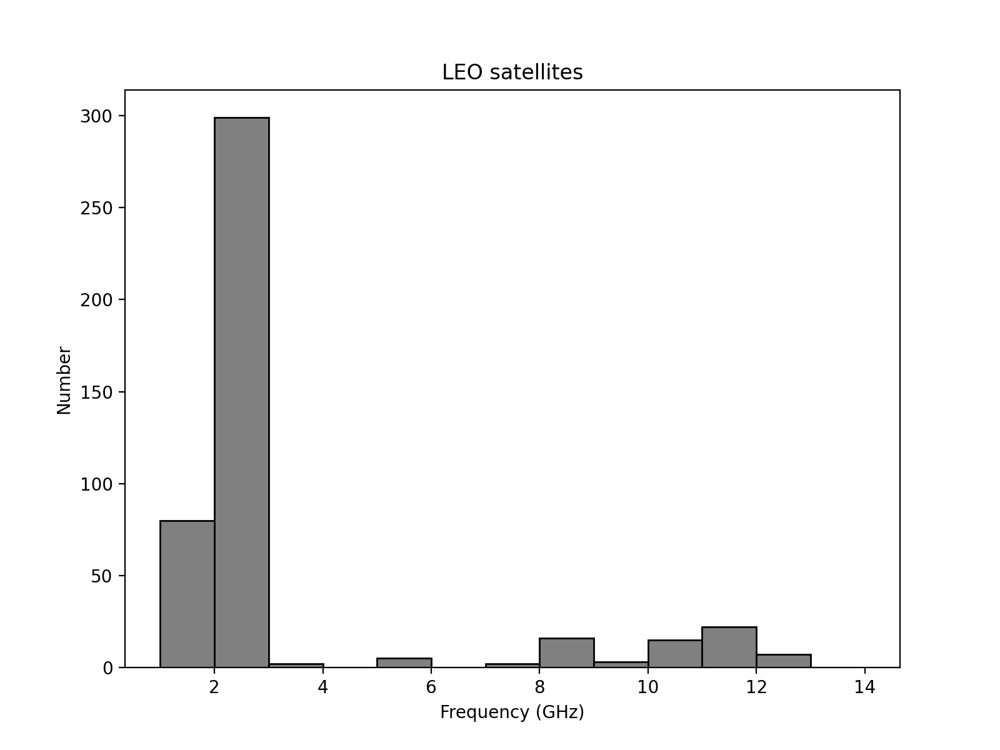

In [245]:
plt.figure(figsize = (8, 6))
plt.bar(x, nleo, width = 1, color = 'grey', edgecolor = 'k')
plt.title('LEO satellites')
plt.xlabel('Frequency (GHz)')
plt.ylabel('Number')
plt.show()

<IPython.core.display.Javascript object>


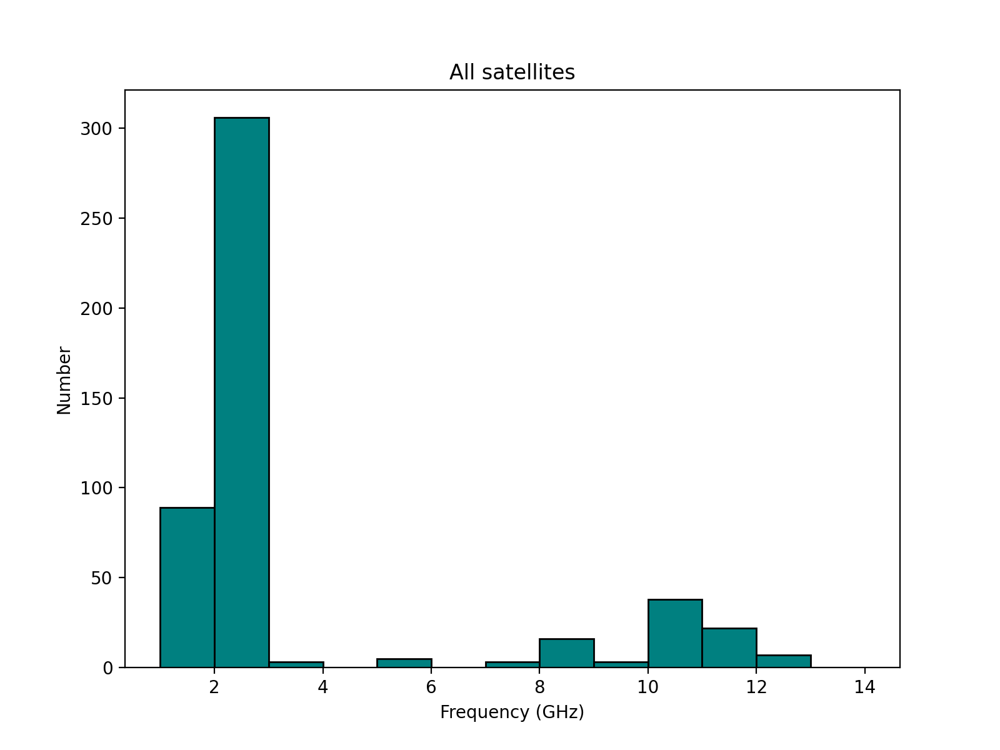

In [246]:
plt.figure(figsize = (8, 6))
plt.bar(x, nall, width = 1, color = 'teal', edgecolor = 'k')
plt.title('All satellites')
plt.xlabel('Frequency (GHz)')
plt.ylabel('Number')
plt.show()

<IPython.core.display.Javascript object>


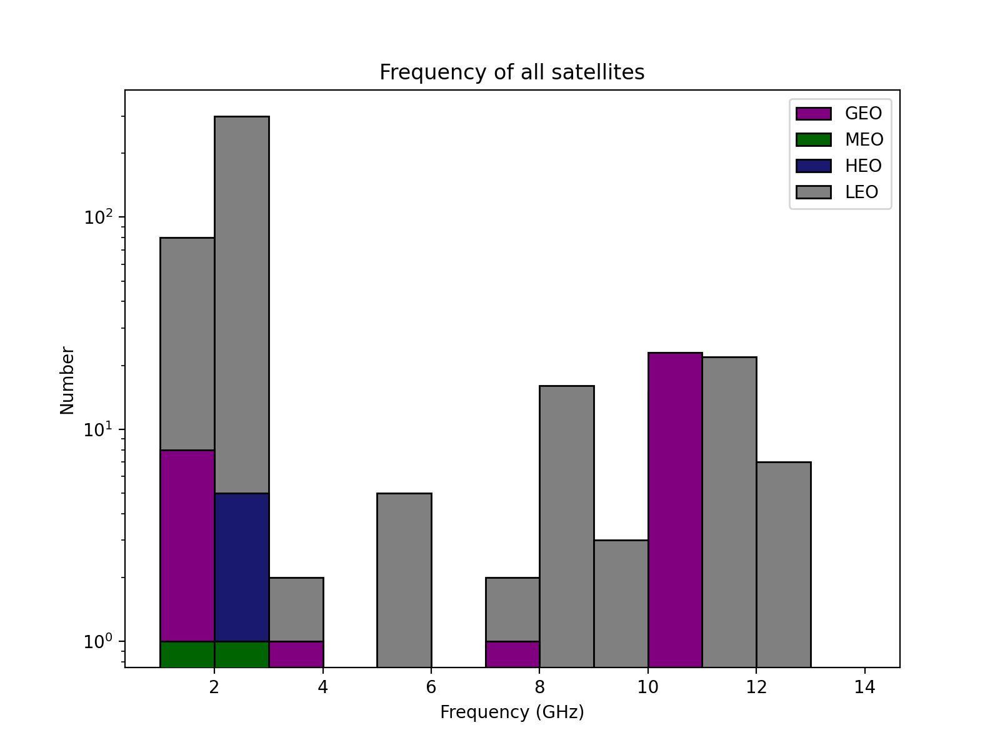

In [247]:
plt.figure(figsize = (8, 6))
plt.bar(x, ngeo, width = 1, color = 'purple', edgecolor = 'k' , zorder = 2, label = 'GEO')
plt.bar(x, nmeo, width = 1, color = 'darkgreen', edgecolor = 'k', zorder = 6, label = "MEO")
plt.bar(x, nheo, width = 1, color = 'midnightblue', edgecolor = 'k', zorder = 1, label = 'HEO')
plt.bar(x, nleo, width = 1, color = 'grey', edgecolor = 'k', zorder = 0, label = 'LEO')
plt.legend()
plt.yscale('log')
plt.title('Frequency of all satellites')
plt.xlabel('Frequency (GHz)')
plt.ylabel('Number')
plt.show()

Making the mollweide plots for the different frequencies

In [248]:
GEO_altf = []
GEO_azf = []
HEO_altf = []
HEO_azf = []
MEO_altf = []
MEO_azf = []
LEO_altf = []
LEO_azf = []
testleo = []

for i in range(len(n)):
    #print(i)
    for j in range(len(GEO)):
        if n[i] == GEO[j]:
            for k in range(len(t)):
                if alt[n[i]][k] > 0:
                #if qgeo5r[j][k] != 0:
                    GEO_altf.append(np.abs(alt[n[i]][k] - 90))
                    GEO_azf.append(az[n[i]][k])
                elif alt[n[i]][k] <= 0:
                    GEO_altf.append(0)
                    GEO_azf.append(0)
                    
for i in range(len(n)):
    for j in range(len(MEO)):
        if n[i] == MEO[j]:
            for k in range(len(t)):
                if alt[n[i]][k] > 0:
                #if qmeo5r[j][k] != 0:
                    MEO_altf.append(np.abs(alt[n[i]][k] - 90))
                    MEO_azf.append(az[n[i]][k])
                elif alt[n[i]][k] <= 0:
                    MEO_altf.append(0)
                    MEO_azf.append(0)
                
for i in range(len(n)):
    for j in range(len(HEO)):
        if n[i] == HEO[j]:
            for k in range(len(t)):
                if alt[n[i]][k] > 0:
                #if qheo5r[j][k] != 0:
                    HEO_altf.append(np.abs(alt[n[i]][k] - 90))
                    HEO_azf.append(az[n[i]][k])
                elif alt[n[i]][k] <= 0:
                    HEO_altf.append(0)
                    HEO_azf.append(0)
                
for h in range(len(n)):
    for j in range(len(LEO)):
        if n[h] == LEO[j]:
            for k in range(len(t)):
                if alt[n[h]][k] > 0:
                    testleo.append(n[h])
                    LEO_altf.append(np.abs(alt[n[h]][k] - 90))
                    LEO_azf.append(az[n[h]][k])
                elif alt[n[h]][k] <= 0:
                    LEO_altf.append(0)
                    LEO_azf.append(0)

In [249]:
GEO_altf = np.reshape(GEO_altf, (len(GEO_freq), 144))
GEO_azf = np.reshape(GEO_azf, (len(GEO_freq), 144))

HEO_altf = np.reshape(HEO_altf, (len(HEO_freq), 144))
HEO_azf = np.reshape(HEO_azf, (len(HEO_freq), 144))

MEO_altf = np.reshape(MEO_altf, (len(MEO_freq), 144))
MEO_azf = np.reshape(MEO_azf, (len(MEO_freq), 144))

LEO_altf = np.reshape(LEO_altf, (len(LEO_freq), 144))
LEO_azf = np.reshape(LEO_azf, (len(LEO_freq), 144))

In [251]:
altf12 = []
altf23 = []
altf34 = []
altf45 = []
altf56 = []
altf67 = []
altf78 = []
altf89 = []
altf910 = []
altf1011 = []
altf1112 = []
altf1213 = []
altf1314 = []

azf12 = []
azf23 = []
azf34 = []
azf45 = []
azf56 = []
azf67 = []
azf78 = []
azf89 = []
azf910 = []
azf1011 = []
azf1112 = []
azf1213 = []
azf1314 = []
for i in range(len(GEO_altf)):
    for j in range(len(t)):
        if GEO_altf[i][j] != 0:
            if 1 <= GEO_freq[i] < (2):
                altf12.append(GEO_altf[i][j])
                azf12.append(GEO_azf[i][j])
            if 2 <= GEO_freq[i] < (3):
                altf23.append(GEO_altf[i][j])
                azf23.append(GEO_azf[i][j])
            if 3 <= GEO_freq[i] < (4):
                altf34.append(GEO_altf[i][j])
                azf34.append(GEO_azf[i][j])
            if 4 <= GEO_freq[i] < (5):
                altf45.append(GEO_altf[i][j])
                azf45.append(GEO_azf[i][j])
            if 5 <= GEO_freq[i] < (6):
                altf56.append(GEO_altf[i][j])
                azf56.append(GEO_azf[i][j])
            if 6 <= GEO_freq[i] < (7):
                altf67.append(GEO_altf[i][j])
                azf67.append(GEO_azf[i][j])
            if 7 <= GEO_freq[i] < (8):
                altf78.append(GEO_altf[i][j])
                azf78.append(GEO_azf[i][j])
            if 8 <= GEO_freq[i] < (9):
                altf89.append(GEO_altf[i][j])
                azf89.append(GEO_azf[i][j])
            if 9 <= GEO_freq[i] < (10):
                altf910.append(GEO_altf[i][j])
                azf910.append(GEO_azf[i][j])
            if 10 <= GEO_freq[i] < (11):
                altf1011.append(GEO_altf[i][j])
                azf1011.append(GEO_azf[i][j])
            if 11 <= GEO_freq[i] < (12):
                altf1112.append(GEO_altf[i][j])
                azf1112.append(GEO_azf[i][j])
            if 12 <= GEO_freq[i] < (13):
                altf1213.append(GEO_altf[i][j])
                azf1213.append(GEO_azf[i][j])
            if 13 <= GEO_freq[i] < (14):
                altf1314.append(GEO_altf[i][j])
                azf1314.append(GEO_azf[i][j])
        
for i in range(len(MEO_altf)):
    for j in range(len(t)):
        if MEO_altf[i][j] != 0:
            if 1 <= MEO_freq[i] < (2):
                altf12.append(MEO_altf[i][j])
                azf12.append(MEO_azf[i][j])
            if 2 <= MEO_freq[i] < (3):
                altf23.append(MEO_altf[i][j])
                azf23.append(MEO_azf[i][j])
            if 3 <= MEO_freq[i] < (4):
                altf34.append(MEO_altf[i][j])
                azf34.append(MEO_azf[i][j])
            if 4 <= MEO_freq[i] < (5):
                altf45.append(MEO_altf[i][j])
                azf45.append(MEO_azf[i][j])
            if 5 <= MEO_freq[i] < (6):
                altf56.append(MEO_altf[i][j])
                azf56.append(MEO_azf[i][j])
            if 6 <= MEO_freq[i] < (7):
                altf67.append(MEO_altf[i][j])
                azf67.append(MEO_azf[i][j])
            if 7 <= MEO_freq[i] < (8):
                altf78.append(MEO_altf[i][j])
                azf78.append(MEO_azf[i][j])
            if 8 <= MEO_freq[i] < (9):
                altf89.append(MEO_altf[i][j])
                azf89.append(MEO_azf[i][j])
            if 9 <= MEO_freq[i] < (10):
                altf910.append(MEO_altf[i][j])
                azf910.append(MEO_azf[i][j])
            if 10 <= MEO_freq[i] < (11):
                altf1011.append(MEO_altf[i][j])
                azf1011.append(MEO_azf[i][j])
            if 11 <= MEO_freq[i] < (12):
                altf1112.append(MEO_altf[i][j])
                azf1112.append(MEO_azf[i][j])
            if 12 <= MEO_freq[i] < (13):
                altf1213.append(MEO_altf[i][j])
                azf1213.append(MEO_azf[i][j])
            if 13 <= MEO_freq[i] < (14):
                altf1314.append(MEO_altf[i][j])
                azf1314.append(MEO_azf[i][j])

for i in range(len(HEO_altf)):
    for j in range(len(t)):
        if HEO_altf[i][j] != 0:
            if 1 <= HEO_freq[i] < (2):
                altf12.append(HEO_altf[i][j])
                azf12.append(HEO_azf[i][j])
            if 2 <= HEO_freq[i] < (3):
                altf23.append(HEO_altf[i][j])
                azf23.append(HEO_azf[i][j])
            if 3 <= HEO_freq[i] < (4):
                altf34.append(HEO_altf[i][j])
                azf34.append(HEO_azf[i][j])
            if 4 <= HEO_freq[i] < (5):
                altf45.append(HEO_altf[i][j])
                azf45.append(HEO_azf[i][j])
            if 5 <= HEO_freq[i] < (6):
                altf56.append(HEO_altf[i][j])
                azf56.append(HEO_azf[i][j])
            if 6 <= HEO_freq[i] < (7):
                altf67.append(HEO_altf[i][j])
                azf67.append(HEO_azf[i][j])
            if 7 <= HEO_freq[i] < (8):
                altf78.append(HEO_altf[i][j])
                azf78.append(HEO_azf[i][j])
            if 8 <= HEO_freq[i] < (9):
                altf89.append(HEO_altf[i][j])
                azf89.append(HEO_azf[i][j])
            if 9 <= HEO_freq[i] < (10):
                altf910.append(HEO_altf[i][j])
                azf910.append(HEO_azf[i][j])
            if 10 <= HEO_freq[i] < (11):
                altf1011.append(HEO_altf[i][j])
                azf1011.append(HEO_azf[i][j])
            if 11 <= HEO_freq[i] < (12):
                altf1112.append(HEO_altf[i][j])
                azf1112.append(HEO_azf[i][j])
            if 12 <= HEO_freq[i] < (13):
                altf1213.append(HEO_altf[i][j])
                azf1213.append(HEO_azf[i][j])
            if 13 <= HEO_freq[i] < (14):
                altf1314.append(HEO_altf[i][j])
                azf1314.append(HEO_azf[i][j])

for i in range(len(LEO_altf)):
    for j in range(len(t)):
        if LEO_altf[i][j] != 0:
            if 1 <= LEO_freq[i] < (2):
                altf12.append(LEO_altf[i][j])
                azf12.append(LEO_azf[i][j])
            if 2 <= LEO_freq[i] < (3):
                altf23.append(LEO_altf[i][j])
                azf23.append(LEO_azf[i][j])
            if 3 <= LEO_freq[i] < (4):
                altf34.append(LEO_altf[i][j])
                azf34.append(LEO_azf[i][j])
            if 4 <= LEO_freq[i] < (5):
                altf45.append(LEO_altf[i][j])
                azf45.append(LEO_azf[i][j])
            if 5 <= LEO_freq[i] < (6):
                altf56.append(LEO_altf[i][j])
                azf56.append(LEO_azf[i][j])
            if 6 <= LEO_freq[i] < (7):
                altf67.append(LEO_altf[i][j])
                azf67.append(LEO_azf[i][j])
            if 7 <= LEO_freq[i] < (8):
                altf78.append(LEO_altf[i][j])
                azf78.append(LEO_azf[i][j])
            if 8 <= LEO_freq[i] < (9):
                altf89.append(LEO_altf[i][j])
                azf89.append(LEO_azf[i][j])
            if 9 <= LEO_freq[i] < (10):
                altf910.append(LEO_altf[i][j])
                azf910.append(LEO_azf[i][j])
            if 10 <= LEO_freq[i] < (11):
                altf1011.append(LEO_altf[i][j])
                azf1011.append(LEO_azf[i][j])
            if 11 <= LEO_freq[i] < (12):
                altf1112.append(LEO_altf[i][j])
                azf1112.append(LEO_azf[i][j])
            if 12 <= LEO_freq[i] < (13):
                altf1213.append(LEO_altf[i][j])
                azf1213.append(LEO_azf[i][j])
            if 13 <= LEO_freq[i] < (14):
                altf1314.append(LEO_altf[i][j])
                azf1314.append(LEO_azf[i][j])

In [252]:
data = [np.arange(len(altf12)), np.arange(len(altf23)), np.arange(len(altf34)), np.arange(len(altf45)), 
        np.arange(len(altf56)), np.arange(len(altf67)), np.arange(len(altf78)), np.arange(len(altf89)), 
        np.arange(len(altf910)), np.arange(len(altf1011)), np.arange(len(altf1112)), np.arange(len(altf1213)), 
        np.arange(len(altf1314))]
theta = [np.radians(altf12), np.radians(altf23), np.radians(altf34), np.radians(altf45), np.radians(altf56),
         np.radians(altf67), np.radians(altf78), np.radians(altf89), np.radians(altf910), np.radians(altf1011),
         np.radians(altf1112), np.radians(altf1213), np.radians(altf1314)]
phi = [np.radians(azf12), np.radians(azf23), np.radians(azf34), np.radians(azf45), np.radians(azf56),
       np.radians(azf67), np.radians(azf78), np.radians(azf89), np.radians(azf910), np.radians(azf1011),
       np.radians(azf1112), np.radians(azf1213), np.radians(azf1314)]


In [253]:
nside = 2**5

In [255]:
(hp.nside2resol(nside) * u.rad).to(u.degree)

<Quantity 1.83225942 deg>

In [256]:
#Turning to face due South again
for i in range(len(phi)):
    for j in range(len(phi[i])):
        if (phi[i][j] + np.pi) >= (2*np.pi):
            phi[i][j] = phi[i][j] - np.pi
        elif (phi[i][j] + np.pi) < (2*np.pi):
            phi[i][j] = phi[i][j] + np.pi

In [257]:
pixel_indices_f = []
paf = []
for i in range(0, 13):
    pixel_indices_f.append(hp.ang2pix(nside, theta[i], phi[i]))
    paf.append(hp.ang2pix(nside, theta[i], phi[i]))

In [258]:
for i in range(len(pixel_indices_f)):
    for j in range(len(pixel_indices_f[i])-1):
        if paf[i][j] == paf[i][j+1]:
            pixel_indices_f[i][j+1] = 0

In [259]:
m12 = np.zeros(hp.nside2npix(nside))
m23 = np.zeros(hp.nside2npix(nside))
m34 = np.zeros(hp.nside2npix(nside))
m45 = np.zeros(hp.nside2npix(nside))
m56 = np.zeros(hp.nside2npix(nside))
m67 = np.zeros(hp.nside2npix(nside))
m78 = np.zeros(hp.nside2npix(nside))
m89 = np.zeros(hp.nside2npix(nside))
m910 = np.zeros(hp.nside2npix(nside))
m1011 = np.zeros(hp.nside2npix(nside))
m1112 = np.zeros(hp.nside2npix(nside))
m1213 = np.zeros(hp.nside2npix(nside))
m1314 = np.zeros(hp.nside2npix(nside))

In [260]:
%%time
for i in range(1, len(m12)):
    for j in range(len(pixel_indices_f[0])):
        if i == pixel_indices_f[0][j]:
            m12[i] += 1
for i in range(1, len(m23)):
    for j in range(len(pixel_indices_f[1])):
        if i == pixel_indices_f[1][j]:
            m23[i] += 1
for i in range(1, len(m34)):
    for j in range(len(pixel_indices_f[2])):
        if i == pixel_indices_f[2][j]:
            m34[i] += 1
for i in range(1, len(m45)):
    for j in range(len(pixel_indices_f[3])):
        if i == pixel_indices_f[3][j]:
            m45[i] += 1
for i in range(1, len(m56)):
    for j in range(len(pixel_indices_f[4])):
        if i == pixel_indices_f[4][j]:
            m56[i] += 1
for i in range(1, len(m67)):
    #print(i)
    for j in range(len(pixel_indices_f[5])):
        if i == pixel_indices_f[5][j]:
            m67[i] += 1
for i in range(1, len(m78)):
    for j in range(len(pixel_indices_f[6])):
        if i == pixel_indices_f[6][j]:
            m78[i] += 1
for i in range(1, len(m89)):
    for j in range(len(pixel_indices_f[7])):
        if i == pixel_indices_f[7][j]:
            m89[i] += 1
for i in range(1, len(m910)):
    for j in range(len(pixel_indices_f[8])):
        if i == pixel_indices_f[8][j]:
            m910[i] += 1
for i in range(1, len(m1011)):
    for j in range(len(pixel_indices_f[9])):
        if i == pixel_indices_f[9][j]:
            m1011[i] += 1
for i in range(1, len(m1112)):
    for j in range(len(pixel_indices_f[10])):
        if i == pixel_indices_f[10][j]:
            m1112[i] += 1
for i in range(1 ,len(m1213)):
    for j in range(len(pixel_indices_f[11])):
        if i == pixel_indices_f[11][j]:
            m1213[i] += 1
for i in range(1, len(m1314)):
    for j in range(len(pixel_indices_f[12])):
        if i == pixel_indices_f[12][j]:
            m1314[i] += 1

CPU times: user 4.17 s, sys: 55.3 ms, total: 4.23 s
Wall time: 4.24 s


In [261]:
print(np.max(m12))
print(np.max(m23))
print(np.max(m34))
print(np.max(m45))
print(np.max(m56))
print(np.max(m67))
print(np.max(m78))
print(np.max(m89))
print(np.max(m910))
print(np.max(m1011))
print(np.max(m1112))
print(np.max(m1213))
print(np.max(m1314))

5.0
10.0
1.0
0.0
3.0
0.0
1.0
2.0
1.0
4.0
4.0
1.0
0.0


<IPython.core.display.Javascript object>


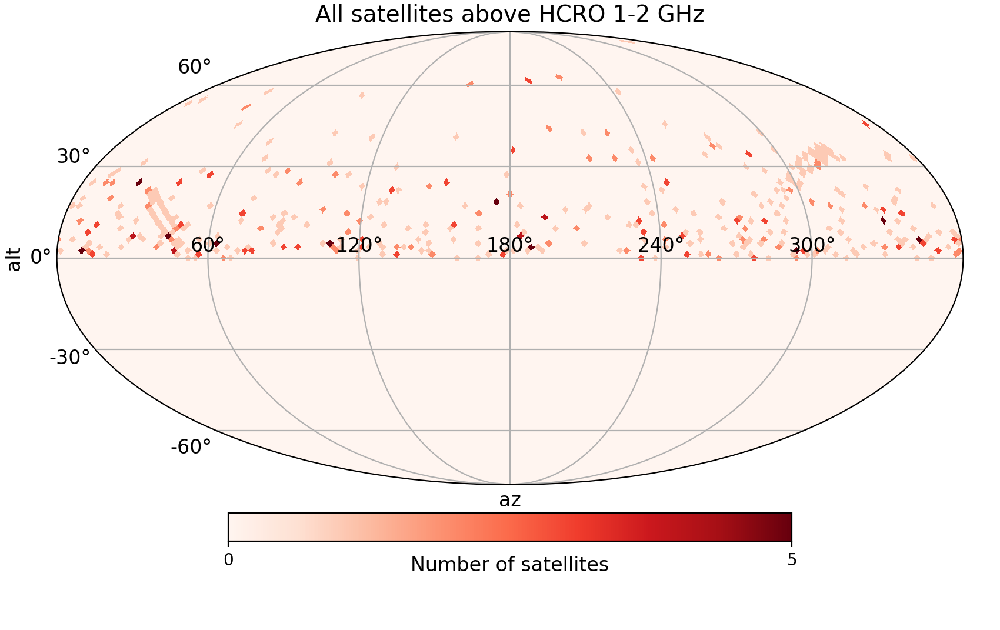

<IPython.core.display.Javascript object>


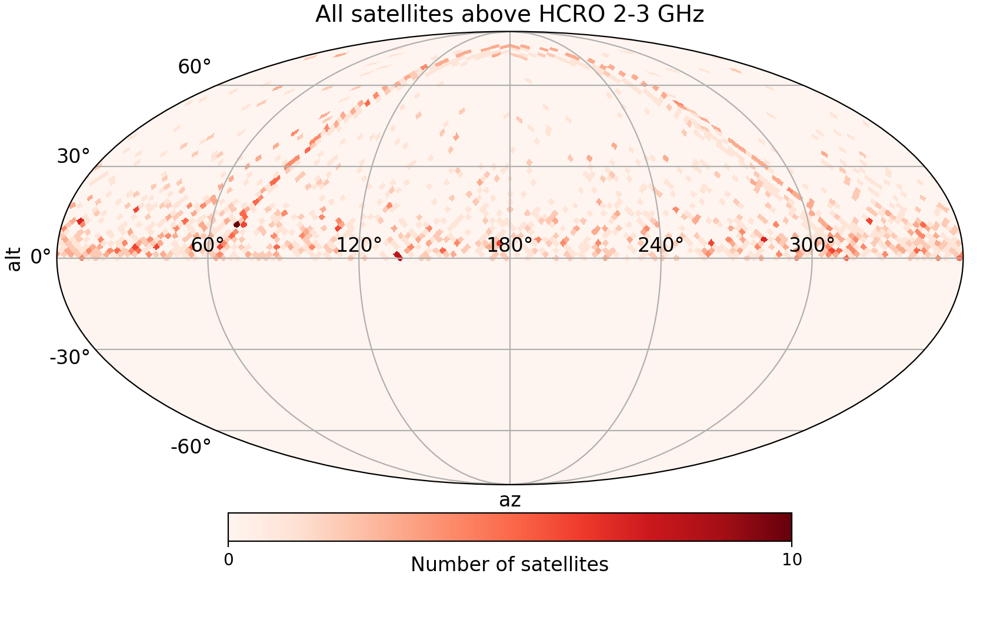

<IPython.core.display.Javascript object>


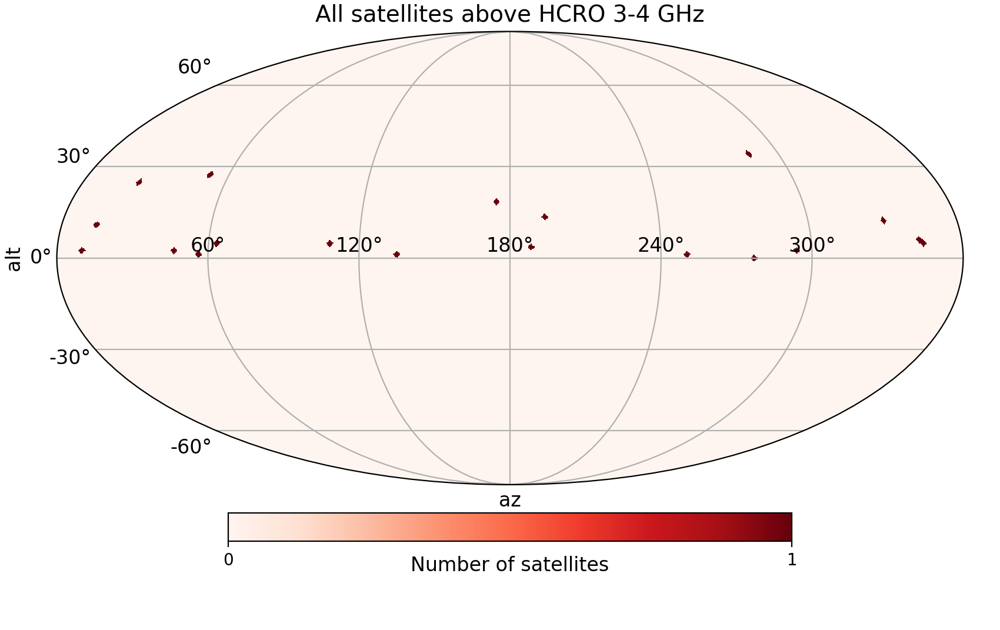

<IPython.core.display.Javascript object>


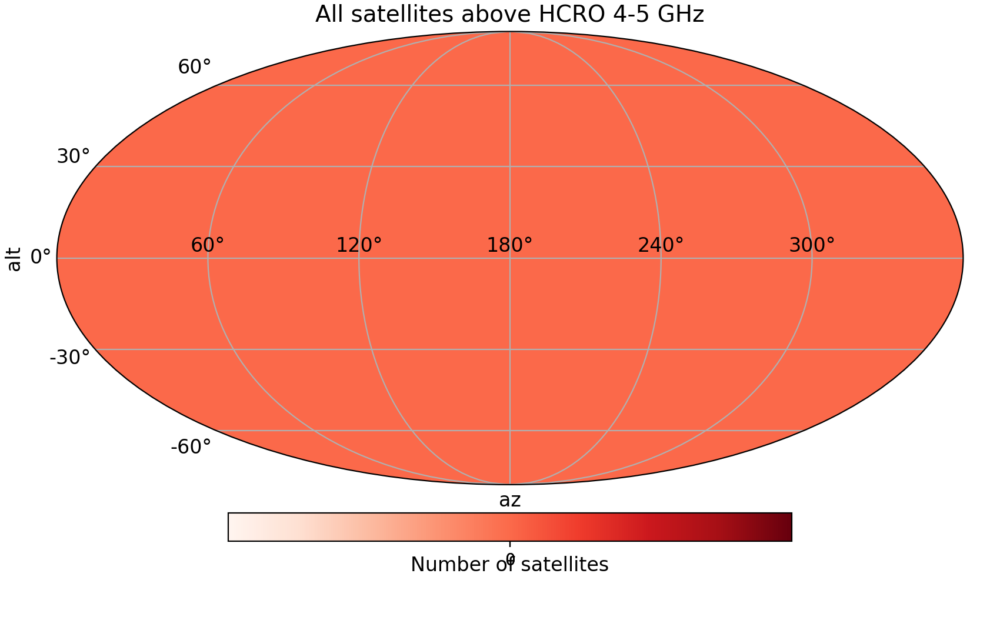

<IPython.core.display.Javascript object>


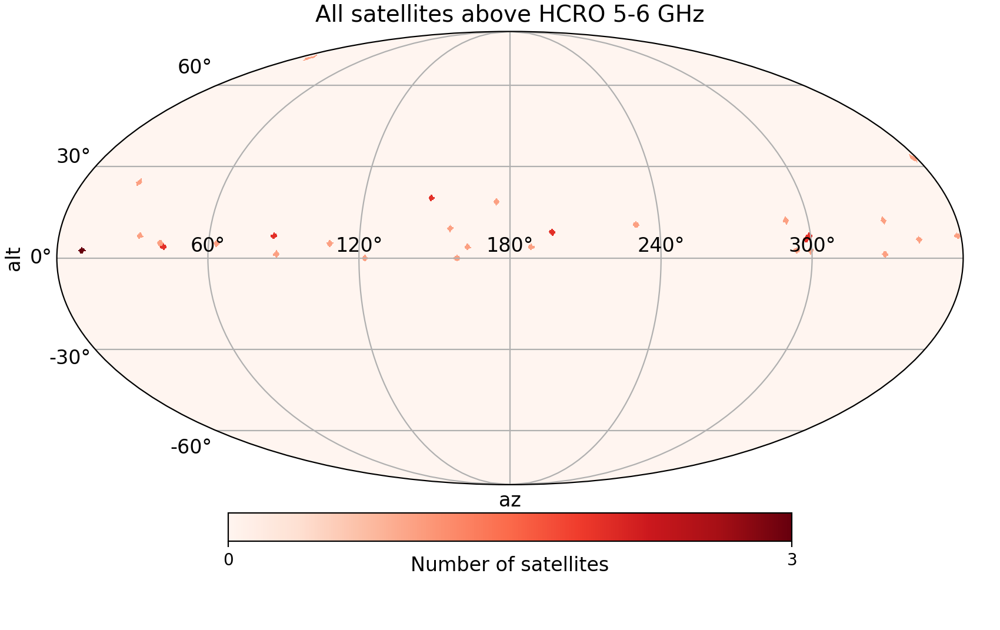

<IPython.core.display.Javascript object>


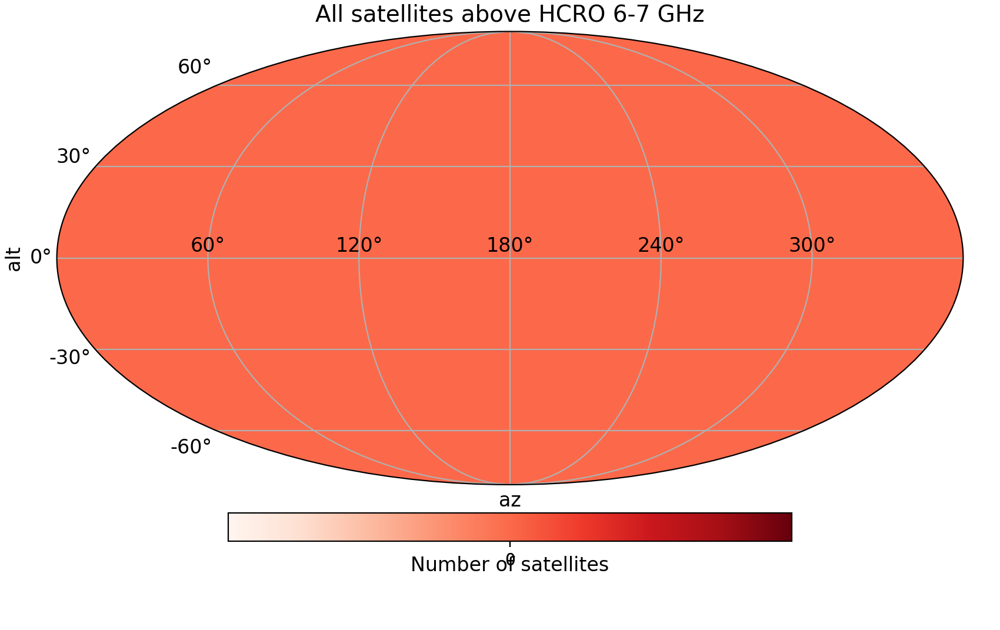

<IPython.core.display.Javascript object>


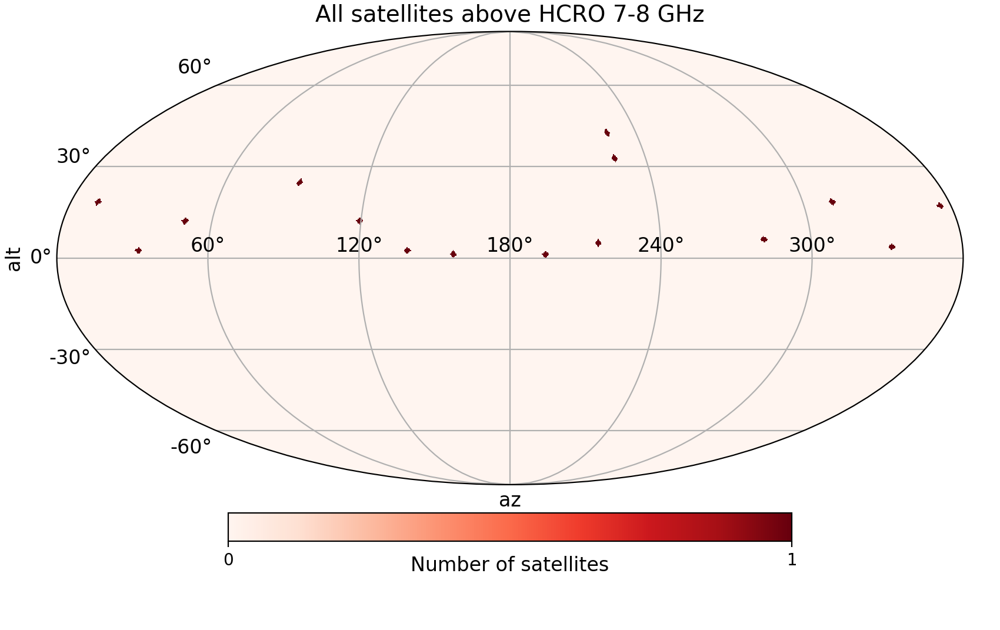

<IPython.core.display.Javascript object>


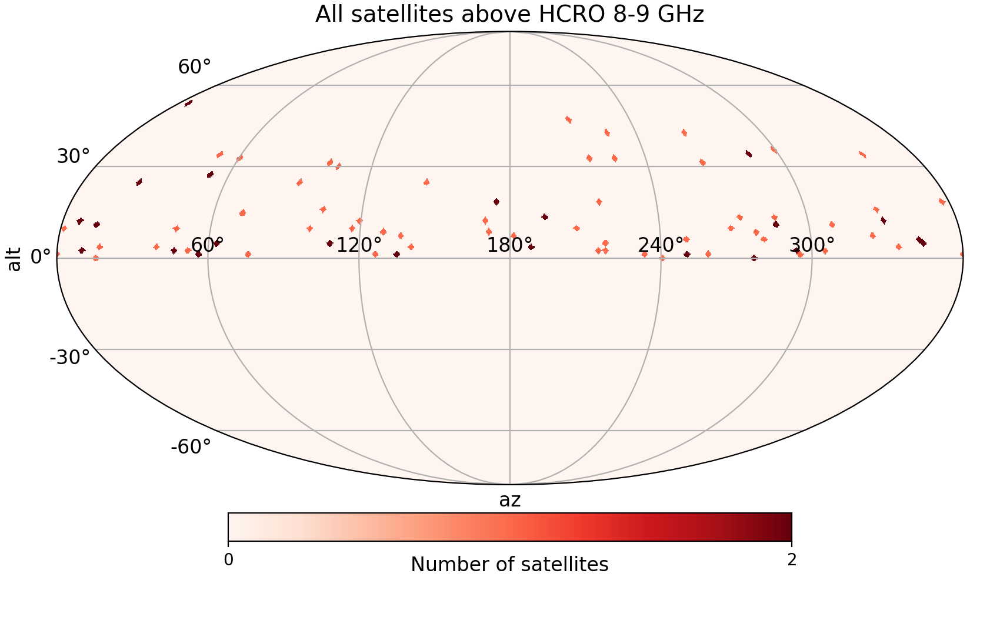

<IPython.core.display.Javascript object>


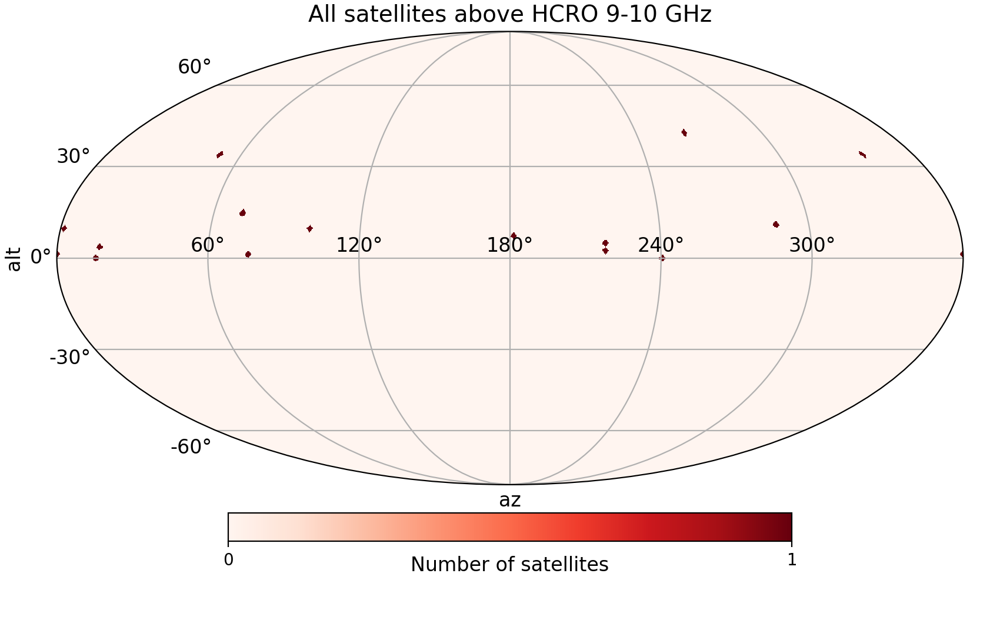

<IPython.core.display.Javascript object>


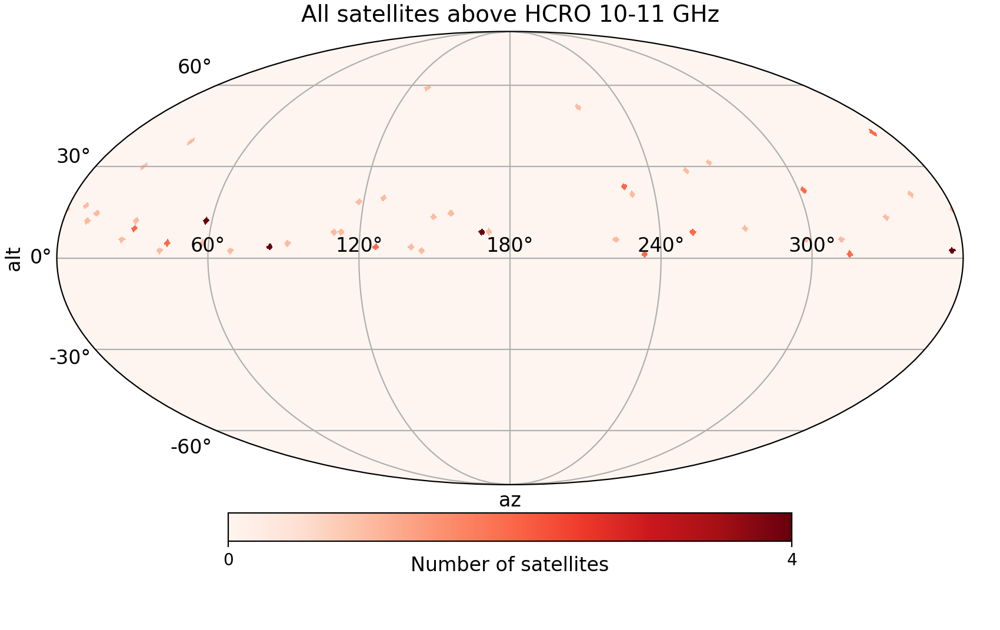

<IPython.core.display.Javascript object>


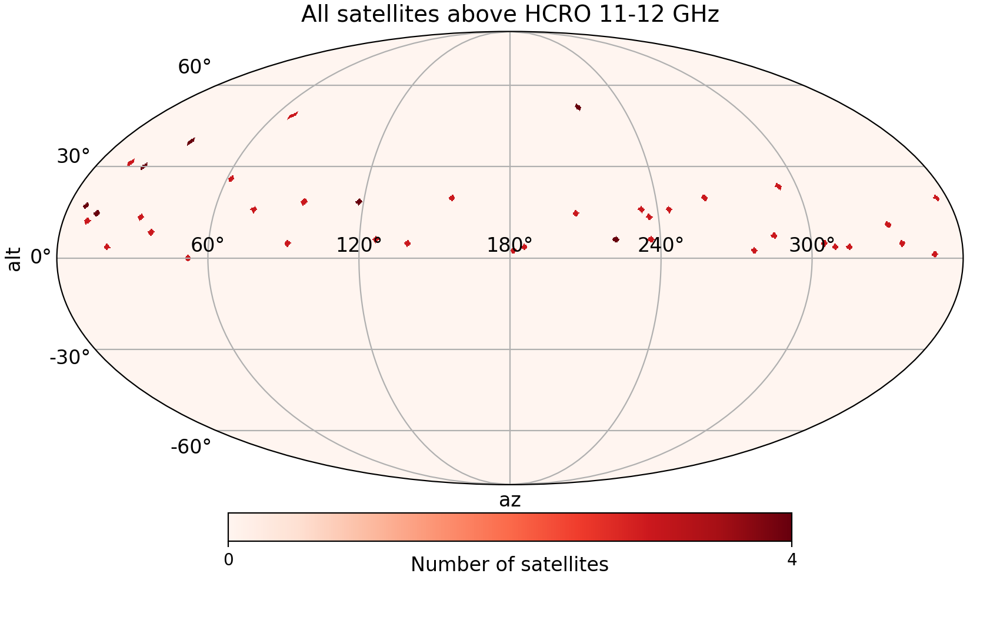

<IPython.core.display.Javascript object>


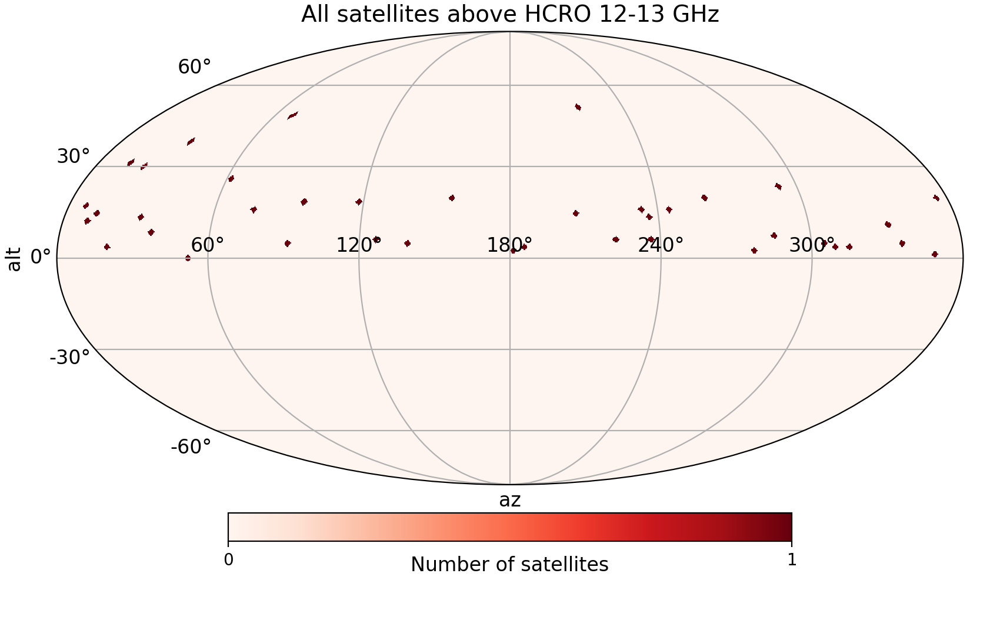

<IPython.core.display.Javascript object>


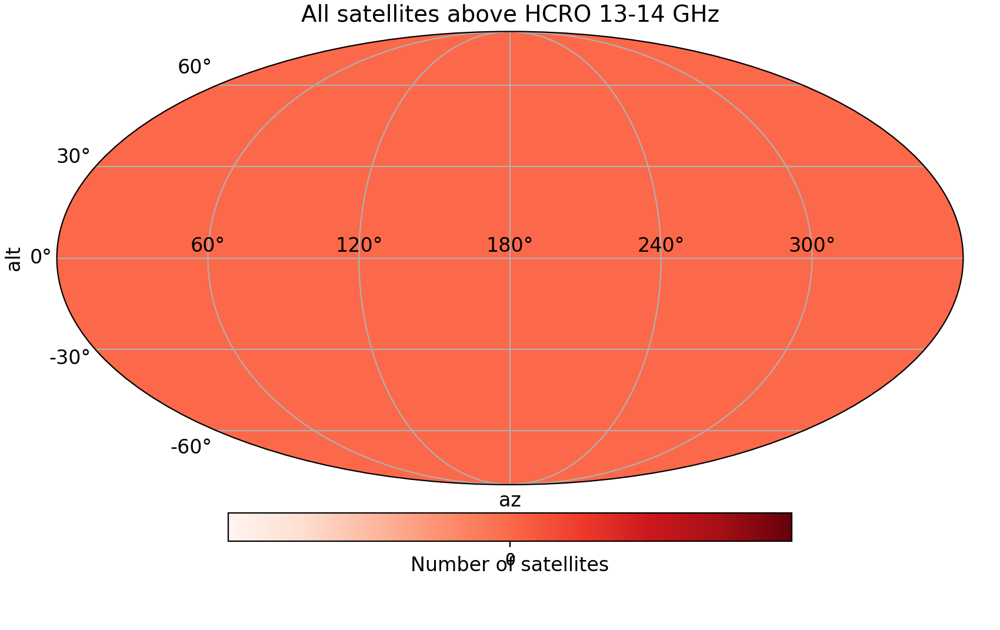

In [262]:
projview(
    m12,
    coord=["G"],
    graticule=True,
    flip = 'geo',
    graticule_labels=True,
    unit="Number of satellites",
    xlabel="az",
    ylabel="alt",
    cb_orientation="horizontal",
    projection_type="mollweide",
    cmap = "Reds",
    title = 'All satellites above HCRO 1-2 GHz',
    phi_convention = 'clockwise',
    custom_xtick_labels = ['60°', '120°', '180°', '240°', '300°'],
   # xtick_label_color = 'white',
);

projview(
    m23,
    coord=["G"],
    graticule=True,
    flip = 'geo',
    graticule_labels=True,
    unit="Number of satellites",
    xlabel="az",
    ylabel="alt",
    cb_orientation="horizontal",
    projection_type="mollweide",
    cmap = "Reds",
    title = 'All satellites above HCRO 2-3 GHz',
    phi_convention = 'clockwise',
    custom_xtick_labels = ['60°', '120°', '180°', '240°', '300°'],
   # xtick_label_color = 'white',
);

projview(
    m34,
    coord=["G"],
    graticule=True,
    flip = 'geo',
    graticule_labels=True,
    unit="Number of satellites",
    xlabel="az",
    ylabel="alt",
    cb_orientation="horizontal",
    projection_type="mollweide",
    cmap = "Reds",
    title = 'All satellites above HCRO 3-4 GHz',
    phi_convention = 'clockwise',
    custom_xtick_labels = ['60°', '120°', '180°', '240°', '300°'],
   # xtick_label_color = 'white',
);

projview(
    m45,
    coord=["G"],
    graticule=True,
    flip = 'geo',
    graticule_labels=True,
    unit="Number of satellites",
    xlabel="az",
    ylabel="alt",
    cb_orientation="horizontal",
    projection_type="mollweide",
    cmap = "Reds",
    title = 'All satellites above HCRO 4-5 GHz',
    phi_convention = 'clockwise',
    custom_xtick_labels = ['60°', '120°', '180°', '240°', '300°'],
   # xtick_label_color = 'white',
);

projview(
    m56,
    coord=["G"],
    graticule=True,
    flip = 'geo',
    graticule_labels=True,
    unit="Number of satellites",
    xlabel="az",
    ylabel="alt",
    cb_orientation="horizontal",
    projection_type="mollweide",
    cmap = "Reds",
    title = 'All satellites above HCRO 5-6 GHz',
    phi_convention = 'clockwise',
    custom_xtick_labels = ['60°', '120°', '180°', '240°', '300°'],
   # xtick_label_color = 'white',
);

projview(
    m67,
    coord=["G"],
    graticule=True,
    flip = 'geo',
    graticule_labels=True,
    unit="Number of satellites",
    xlabel="az",
    ylabel="alt",
    cb_orientation="horizontal",
    projection_type="mollweide",
    cmap = "Reds",
    title = 'All satellites above HCRO 6-7 GHz',
    phi_convention = 'clockwise',
    custom_xtick_labels = ['60°', '120°', '180°', '240°', '300°'],
   # xtick_label_color = 'white',
);

projview(
    m78,
    coord=["G"],
    graticule=True,
    flip = 'geo',
    graticule_labels=True,
    unit="Number of satellites",
    xlabel="az",
    ylabel="alt",
    cb_orientation="horizontal",
    projection_type="mollweide",
    cmap = "Reds",
    title = 'All satellites above HCRO 7-8 GHz',
    phi_convention = 'clockwise',
    custom_xtick_labels = ['60°', '120°', '180°', '240°', '300°'],
   # xtick_label_color = 'white',
);

projview(
    m89,
    coord=["G"],
    graticule=True,
    flip = 'geo',
    graticule_labels=True,
    unit="Number of satellites",
    xlabel="az",
    ylabel="alt",
    cb_orientation="horizontal",
    projection_type="mollweide",
    cmap = "Reds",
    title = 'All satellites above HCRO 8-9 GHz',
    phi_convention = 'clockwise',
    custom_xtick_labels = ['60°', '120°', '180°', '240°', '300°'],
   # xtick_label_color = 'white',
);

projview(
    m910,
    coord=["G"],
    graticule=True,
    flip = 'geo',
    graticule_labels=True,
    unit="Number of satellites",
    xlabel="az",
    ylabel="alt",
    cb_orientation="horizontal",
    projection_type="mollweide",
    cmap = "Reds",
    title = 'All satellites above HCRO 9-10 GHz',
    phi_convention = 'clockwise',
    custom_xtick_labels = ['60°', '120°', '180°', '240°', '300°'],
   # xtick_label_color = 'white',
);

projview(
    m1011,
    coord=["G"],
    graticule=True,
    flip = 'geo',
    graticule_labels=True,
    unit="Number of satellites",
    xlabel="az",
    ylabel="alt",
    cb_orientation="horizontal",
    projection_type="mollweide",
    cmap = "Reds",
    title = 'All satellites above HCRO 10-11 GHz',
    phi_convention = 'clockwise',
    custom_xtick_labels = ['60°', '120°', '180°', '240°', '300°'],
   # xtick_label_color = 'white',
);

projview(
    m1112,
    coord=["G"],
    graticule=True,
    flip = 'geo',
    graticule_labels=True,
    unit="Number of satellites",
    xlabel="az",
    ylabel="alt",
    cb_orientation="horizontal",
    projection_type="mollweide",
    cmap = "Reds",
    title = 'All satellites above HCRO 11-12 GHz',
    phi_convention = 'clockwise',
    custom_xtick_labels = ['60°', '120°', '180°', '240°', '300°'],
   # xtick_label_color = 'white',
);

projview(
    m1213,
    coord=["G"],
    graticule=True,
    flip = 'geo',
    graticule_labels=True,
    unit="Number of satellites",
    xlabel="az",
    ylabel="alt",
    cb_orientation="horizontal",
    projection_type="mollweide",
    cmap = "Reds",
    title = 'All satellites above HCRO 12-13 GHz',
    phi_convention = 'clockwise',
    custom_xtick_labels = ['60°', '120°', '180°', '240°', '300°'],
   # xtick_label_color = 'white',
);

projview(
    m1314,
    coord=["G"],
    graticule=True,
    flip = 'geo',
    graticule_labels=True,
    unit="Number of satellites",
    xlabel="az",
    ylabel="alt",
    cb_orientation="horizontal",
    projection_type="mollweide",
    cmap = "Reds",
    title = 'All satellites above HCRO 13-14 GHz',
    phi_convention = 'clockwise',
    custom_xtick_labels = ['60°', '120°', '180°', '240°', '300°'],
   # xtick_label_color = 'white',
);
